In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from patsy import dmatrices
import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score, roc_auc_score
from statsmodels.stats.outliers_influence import variance_inflation_factor

plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 100

sns.set_style('whitegrid')
sns.set({'figure.figsize' : (12, 8)})

데이터 셋 로딩

In [3]:
lol = pd.read_csv("KRmatch.csv")
lol

,Unnamed: 0,d_spell,f_spell,champion,side,role,assists,damage_objectives,damage_building,damage_turrets,...,kda,kills,level,time_cc,damage_total,damage_taken,total_minions_killed,turret_kills,vision_score,result
0,0,14,4,Leona,Side.blue,Lane.utility,6,0,0,0,...,1.333333,2,9,23,15214,9404,36,0,47,False
1,1,11,4,Udyr,Side.red,Lane.jungle,8,547,46480,547,...,6.666667,12,16,32,194463,25782,23,1,20,True
2,2,14,4,Xerath,Side.red,Lane.utility,2,168,444,168,...,0.285714,0,10,22,34038,14079,26,0,38,False
3,3,14,4,Zoe,Side.red,Lane.mid_lane,8,2492,3082,2492,...,5.000000,7,14,29,94369,11128,133,2,17,True
4,4,4,12,Camille,Side.red,Lane.top_lane,8,6419,7408,6419,...,4.200000,13,15,25,110580,20404,141,2,24,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5692,5692,12,4,Vex,Side.red,Lane.mid_lane,18,1361,12122,1361,...,4.166667,7,16,39,140108,20916,174,0,14,False
5693,5693,4,7,Ezreal,Side.red,Lane.bot_lane,10,2097,21663,2097,...,1.285714,8,18,3,275357,35430,253,0,41,False
5694,5694,12,4,Jayce,Side.red,Lane.top_lane,3,3426,5433,3426,...,1.500000,3,13,4,99117,10839,169,1,18,True
5695,5695,4,11,Nidalee,Side.red,Lane.jungle,6,1249,15882,1249,...,7.500000,9,11,5,100611,14168,22,1,19,True


데이터 셋 정리 및 결측치 확인

In [4]:
# Unnamed column & Spell columns delete
lol = lol.drop([lol.columns[0], lol.columns[1], lol.columns[2]], axis = 1)
lol

,champion,side,role,assists,damage_objectives,damage_building,damage_turrets,deaths,gold_earned,kda,kills,level,time_cc,damage_total,damage_taken,total_minions_killed,turret_kills,vision_score,result
0,Leona,Side.blue,Lane.utility,6,0,0,0,6,6043,1.333333,2,9,23,15214,9404,36,0,47,False
1,Udyr,Side.red,Lane.jungle,8,547,46480,547,3,12919,6.666667,12,16,32,194463,25782,23,1,20,True
2,Xerath,Side.red,Lane.utility,2,168,444,168,7,5641,0.285714,0,10,22,34038,14079,26,0,38,False
3,Zoe,Side.red,Lane.mid_lane,8,2492,3082,2492,3,10688,5.000000,7,14,29,94369,11128,133,2,17,True
4,Camille,Side.red,Lane.top_lane,8,6419,7408,6419,5,12368,4.200000,13,15,25,110580,20404,141,2,24,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5692,Vex,Side.red,Lane.mid_lane,18,1361,12122,1361,6,12178,4.166667,7,16,39,140108,20916,174,0,14,False
5693,Ezreal,Side.red,Lane.bot_lane,10,2097,21663,2097,14,18347,1.285714,8,18,3,275357,35430,253,0,41,False
5694,Jayce,Side.red,Lane.top_lane,3,3426,5433,3426,4,9262,1.500000,3,13,4,99117,10839,169,1,18,True
5695,Nidalee,Side.red,Lane.jungle,6,1249,15882,1249,2,8863,7.500000,9,11,5,100611,14168,22,1,19,True


In [42]:
lol.describe()

,assists,damage_objectives,damage_building,damage_turrets,deaths,gold_earned,kda,kills,level,time_cc,damage_total,damage_taken,total_minions_killed,turret_kills,vision_score
count,5697.000000,5697.000000,5697.000000,5697.000000,5697.000000,5697.000000,5697.000000,5697.000000,5697.000000,5697.000000,5697.000000,5697.000000,5697.000000,5697.000000,5697.000000
mean,7.805512,2563.303493,9085.031596,2563.303493,5.479200,10342.235212,3.733699,5.423732,13.287520,17.957170,107735.695103,19500.235914,116.970686,0.981745,30.043181
std,5.419037,3230.325379,10276.550852,3230.325379,2.954292,3500.329873,3.988976,4.183827,2.458827,14.474076,66545.267335,8997.141642,80.843734,1.276964,21.654914
min,0.000000,0.000000,0.000000,0.000000,0.000000,2900.000000,0.000000,0.000000,6.000000,0.000000,3597.000000,1736.000000,1.000000,0.000000,1.000000
25%,4.000000,339.000000,1546.000000,339.000000,3.000000,7748.000000,1.285714,2.000000,12.000000,8.000000,58818.000000,13101.000000,33.000000,0.000000,16.000000
50%,7.000000,1498.000000,5109.000000,1498.000000,5.000000,9961.000000,2.333333,4.000000,13.000000,15.000000,104732.000000,18091.000000,130.000000,1.000000,24.000000
75%,11.000000,3679.000000,13104.000000,3679.000000,7.000000,12549.000000,4.600000,8.000000,15.000000,24.000000,148123.000000,24148.000000,182.000000,2.000000,36.000000
max,39.000000,50654.000000,68640.000000,50654.000000,16.000000,28541.000000,33.000000,24.000000,18.000000,280.000000,541303.000000,83072.000000,472.000000,8.000000,175.000000


In [43]:
lol.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5697 entries, 0 to 5696
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   champion              5697 non-null   object 
 1   side                  5697 non-null   object 
 2   role                  5697 non-null   object 
 3   assists               5697 non-null   int64  
 4   damage_objectives     5697 non-null   int64  
 5   damage_building       5697 non-null   int64  
 6   damage_turrets        5697 non-null   int64  
 7   deaths                5697 non-null   int64  
 8   gold_earned           5697 non-null   int64  
 9   kda                   5697 non-null   float64
 10  kills                 5697 non-null   int64  
 11  level                 5697 non-null   int64  
 12  time_cc               5697 non-null   int64  
 13  damage_total          5697 non-null   int64  
 14  damage_taken          5697 non-null   int64  
 15  total_minions_killed 

In [44]:
lol.isnull().sum()

champion                0
side                    0
role                    0
assists                 0
damage_objectives       0
damage_building         0
damage_turrets          0
deaths                  0
gold_earned             0
kda                     0
kills                   0
level                   0
time_cc                 0
damage_total            0
damage_taken            0
total_minions_killed    0
turret_kills            0
vision_score            0
result                  0
dtype: int64

In [45]:
# 가장 많은 선택을 받은 챔피언

lol['champion'].value_counts(ascending = False)

champion
Jhin       218
LeeSin     214
Graves     205
Yone       151
Caitlyn    143
          ... 
Gnar         1
Fizz         1
Brand        1
Ivern        1
Rammus       1
Name: count, Length: 148, dtype: int64

In [5]:
lol['role'] = lol['role'].replace('Lane.top_lane', 'Top')
lol['role'] = lol['role'].replace('Lane.jungle', 'Jungle')
lol['role'] = lol['role'].replace('Lane.mid_lane', 'Mid')
lol['role'] = lol['role'].replace('Lane.bot_lane', 'Bot')
lol['role'] = lol['role'].replace('Lane.utility', 'Support')

lol['side'] = lol['side'].replace('Side.red', 'Red')
lol['side'] = lol['side'].replace('Side.blue', 'Blue')

lol['result'] = lol['result'].replace(True, 'Win')
lol['result'] = lol['result'].replace(False, 'Lose')

lol

,champion,side,role,assists,damage_objectives,damage_building,damage_turrets,deaths,gold_earned,kda,kills,level,time_cc,damage_total,damage_taken,total_minions_killed,turret_kills,vision_score,result
0,Leona,Blue,Support,6,0,0,0,6,6043,1.333333,2,9,23,15214,9404,36,0,47,Lose
1,Udyr,Red,Jungle,8,547,46480,547,3,12919,6.666667,12,16,32,194463,25782,23,1,20,Win
2,Xerath,Red,Support,2,168,444,168,7,5641,0.285714,0,10,22,34038,14079,26,0,38,Lose
3,Zoe,Red,Mid,8,2492,3082,2492,3,10688,5.000000,7,14,29,94369,11128,133,2,17,Win
4,Camille,Red,Top,8,6419,7408,6419,5,12368,4.200000,13,15,25,110580,20404,141,2,24,Win
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5692,Vex,Red,Mid,18,1361,12122,1361,6,12178,4.166667,7,16,39,140108,20916,174,0,14,Lose
5693,Ezreal,Red,Bot,10,2097,21663,2097,14,18347,1.285714,8,18,3,275357,35430,253,0,41,Lose
5694,Jayce,Red,Top,3,3426,5433,3426,4,9262,1.500000,3,13,4,99117,10839,169,1,18,Win
5695,Nidalee,Red,Jungle,6,1249,15882,1249,2,8863,7.500000,9,11,5,100611,14168,22,1,19,Win


In [6]:
# 이긴 데이터와 진 데이터 분리

win_lol = lol.loc[lol['result'] == 'Win']
win_lol

,champion,side,role,assists,damage_objectives,damage_building,damage_turrets,deaths,gold_earned,kda,kills,level,time_cc,damage_total,damage_taken,total_minions_killed,turret_kills,vision_score,result
1,Udyr,Red,Jungle,8,547,46480,547,3,12919,6.666667,12,16,32,194463,25782,23,1,20,Win
3,Zoe,Red,Mid,8,2492,3082,2492,3,10688,5.000000,7,14,29,94369,11128,133,2,17,Win
4,Camille,Red,Top,8,6419,7408,6419,5,12368,4.200000,13,15,25,110580,20404,141,2,24,Win
5,Alistar,Red,Support,14,625,1144,625,3,6471,5.000000,1,11,37,17852,11112,25,0,30,Win
6,Thresh,Red,Support,20,529,850,529,6,8208,3.666667,2,13,39,20610,17838,33,0,63,Win
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5688,Graves,Red,Top,2,2654,18778,2654,2,9404,3.500000,5,13,7,120169,13610,159,2,23,Win
5691,Kaisa,Red,Bot,4,3492,3492,3492,3,7789,3.666667,7,11,0,60944,7388,117,1,19,Win
5694,Jayce,Red,Top,3,3426,5433,3426,4,9262,1.500000,3,13,4,99117,10839,169,1,18,Win
5695,Nidalee,Red,Jungle,6,1249,15882,1249,2,8863,7.500000,9,11,5,100611,14168,22,1,19,Win


In [7]:
lose_lol = lol.loc[lol['result'] == 'Lose']
lose_lol

,champion,side,role,assists,damage_objectives,damage_building,damage_turrets,deaths,gold_earned,kda,kills,level,time_cc,damage_total,damage_taken,total_minions_killed,turret_kills,vision_score,result
0,Leona,Blue,Support,6,0,0,0,6,6043,1.333333,2,9,23,15214,9404,36,0,47,Lose
2,Xerath,Red,Support,2,168,444,168,7,5641,0.285714,0,10,22,34038,14079,26,0,38,Lose
7,Xayah,Red,Bot,9,3657,16688,3657,5,16108,3.600000,9,17,18,244314,20799,262,2,38,Lose
9,XinZhao,Blue,Jungle,2,1322,14485,1322,7,10050,1.428571,8,12,14,110857,25643,24,1,24,Lose
10,Jhin,Blue,Bot,2,459,2081,459,9,5453,0.444444,2,9,12,46588,13083,94,0,7,Lose
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5685,Ezreal,Red,Bot,4,3211,4612,3211,6,13915,1.333333,4,14,7,158429,21330,230,0,21,Lose
5689,Leona,Red,Support,11,214,311,214,5,5371,2.200000,0,11,49,18711,14985,32,0,39,Lose
5690,Jhin,Red,Bot,4,843,1255,843,6,9398,1.666667,6,11,18,96000,13852,147,0,6,Lose
5692,Vex,Red,Mid,18,1361,12122,1361,6,12178,4.166667,7,16,39,140108,20916,174,0,14,Lose


In [8]:
# 라인별 데이터 분리

Top_data = lol[lol['role'] == 'Top']
Jungle_data = lol[lol['role'] == 'Jungle']
Mid_data = lol[lol['role'] == 'Mid']
Bot_data = lol[lol['role'] == 'Bot']
Support_data = lol[lol['role'] == 'Support']

print("TOP data :", len(Top_data))
print("JUNGLE data :", len(Jungle_data))
print("MID data :", len(Mid_data))
print("BOT data :", len(Bot_data))
print("SUPPORT data :", len(Support_data))

TOP data : 1141
JUNGLE data : 1148
MID data : 1128
BOT data : 1127
SUPPORT data : 1153


In [9]:
# under level 10 means : game finished before 15min

lol.loc[lol['level'] < 10, ['level']] = np.nan

lol = lol.dropna(subset = ['level'])
lol

,champion,side,role,assists,damage_objectives,damage_building,damage_turrets,deaths,gold_earned,kda,kills,level,time_cc,damage_total,damage_taken,total_minions_killed,turret_kills,vision_score,result
1,Udyr,Red,Jungle,8,547,46480,547,3,12919,6.666667,12,16.0,32,194463,25782,23,1,20,Win
2,Xerath,Red,Support,2,168,444,168,7,5641,0.285714,0,10.0,22,34038,14079,26,0,38,Lose
3,Zoe,Red,Mid,8,2492,3082,2492,3,10688,5.000000,7,14.0,29,94369,11128,133,2,17,Win
4,Camille,Red,Top,8,6419,7408,6419,5,12368,4.200000,13,15.0,25,110580,20404,141,2,24,Win
5,Alistar,Red,Support,14,625,1144,625,3,6471,5.000000,1,11.0,37,17852,11112,25,0,30,Win
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5692,Vex,Red,Mid,18,1361,12122,1361,6,12178,4.166667,7,16.0,39,140108,20916,174,0,14,Lose
5693,Ezreal,Red,Bot,10,2097,21663,2097,14,18347,1.285714,8,18.0,3,275357,35430,253,0,41,Lose
5694,Jayce,Red,Top,3,3426,5433,3426,4,9262,1.500000,3,13.0,4,99117,10839,169,1,18,Win
5695,Nidalee,Red,Jungle,6,1249,15882,1249,2,8863,7.500000,9,11.0,5,100611,14168,22,1,19,Win


In [10]:
Win_Top_Line = win_lol.loc[win_lol.role == "Top"]
print("Number of Top Wins :", len(Win_Top_Line))

Win_Jungle_Line = win_lol.loc[win_lol.role == "Jungle"]
print("Number of Jungle Wins :", len(Win_Jungle_Line))

Win_Mid_Line = win_lol.loc[win_lol.role == "Mid"]
print("Number of Mid Wins :", len(Win_Mid_Line))

Win_Bot_Line = win_lol.loc[win_lol.role == "Bot"]
print("Number of Bot Wins :", len(Win_Bot_Line))

Win_Support_Line = win_lol.loc[win_lol.role == "Support"]
print("Number of Support Wins :", len(Win_Support_Line))

Number of Top Wins : 587
Number of Jungle Wins : 600
Number of Mid Wins : 523
Number of Bot Wins : 554
Number of Support Wins : 562


In [11]:
Lose_Top_Line = lose_lol.loc[lose_lol.role == "Top"]
print("Number of Top Looses :", len(Lose_Top_Line))

Lose_Jungle_Line = lose_lol.loc[lose_lol.role == "Jungle"]
print("Number of Jungle Looses :", len(Lose_Jungle_Line))

Lose_Mid_Line = lose_lol.loc[lose_lol.role == "Mid"]
print("Number of Mid Looses :", len(Lose_Mid_Line))

Lose_Bot_Line = lose_lol.loc[lose_lol.role == "Bot"]
print("Number of Bot Looses :", len(Lose_Bot_Line))

Lose_Support_Line = lose_lol.loc[lose_lol.role == "Support"]
print("Number of Support Looses :", len(Lose_Support_Line))

Number of Top Looses : 554
Number of Jungle Looses : 548
Number of Mid Looses : 605
Number of Bot Looses : 573
Number of Support Looses : 591


In [12]:
Top_most_pick = Top_data['champion'].value_counts().idxmax()
Jungle_most_pick = Jungle_data['champion'].value_counts().idxmax()
Mid_most_pick = Mid_data['champion'].value_counts().idxmax()
Bot_most_pick = Bot_data['champion'].value_counts().idxmax()
Support_most_pick = Support_data['champion'].value_counts().idxmax()

print("Top most pick champion is {}.".format(Top_most_pick))
print("Jungle most pick champion is {}.".format(Jungle_most_pick))
print("Mid most pick champion is {}.".format(Mid_most_pick))
print("Bot most pick champion is {}.".format(Bot_most_pick))
print("Support most pick champion is {}.".format(Support_most_pick))

Top most pick champion is Jayce.
Jungle most pick champion is LeeSin.
Mid most pick champion is Viktor.
Bot most pick champion is Jhin.
Support most pick champion is Thresh.


In [13]:
Win_Top_most_pick = Win_Top_Line['champion'].value_counts().idxmax()
Win_Jungle_most_pick = Win_Jungle_Line['champion'].value_counts().idxmax()
Win_Mid_most_pick = Win_Mid_Line['champion'].value_counts().idxmax()
Win_Bot_most_pick = Win_Bot_Line['champion'].value_counts().idxmax()
Win_Support_most_pick = Win_Support_Line['champion'].value_counts().idxmax()

print("Winning Top most pick champion is {}.".format(Win_Top_most_pick))
print("Winning Jungle most pick champion is {}.".format(Win_Jungle_most_pick))
print("Winning Mid most pick champion is {}.".format(Win_Mid_most_pick))
print("Winning Bot most pick champion is {}.".format(Win_Bot_most_pick))
print("Winning Support most pick champion is {}.".format(Win_Support_most_pick))

Winning Top most pick champion is Jayce.
Winning Jungle most pick champion is LeeSin.
Winning Mid most pick champion is Viktor.
Winning Bot most pick champion is Jhin.
Winning Support most pick champion is Rakan.


In [14]:
Lose_Top_most_pick = Lose_Top_Line['champion'].value_counts().idxmax()
Lose_Jungle_most_pick = Lose_Jungle_Line['champion'].value_counts().idxmax()
Lose_Mid_most_pick = Lose_Mid_Line['champion'].value_counts().idxmax()
Lose_Bot_most_pick = Lose_Bot_Line['champion'].value_counts().idxmax()
Lose_Support_most_pick = Lose_Support_Line['champion'].value_counts().idxmax()

print("Losing Top most pick champion is {}.".format(Lose_Top_most_pick))
print("Losing Jungle most pick champion is {}.".format(Lose_Jungle_most_pick))
print("Losing Mid most pick champion is {}.".format(Lose_Mid_most_pick))
print("Losing Bot most pick champion is {}.".format(Lose_Bot_most_pick))
print("Losing Support most pick champion is {}.".format(Lose_Support_most_pick))

Losing Top most pick champion is Jayce.
Losing Jungle most pick champion is LeeSin.
Losing Mid most pick champion is Viktor.
Losing Bot most pick champion is Jhin.
Losing Support most pick champion is Thresh.


In [15]:
Top_Winning_Rate = len(Win_Top_Line) / len(Top_data)
Jungle_Winning_Rate = len(Win_Jungle_Line) / len(Jungle_data)
Mid_Winning_Rate = len(Win_Mid_Line) / len(Mid_data)
Bot_Winning_Rate = len(Win_Bot_Line) / len(Bot_data)
Support_Winning_Rate = len(Win_Support_Line) / len(Support_data)

print("Top Winning Rate is {:.2f}%".format((Top_Winning_Rate) * 100))
print("Jungle Winning Rate is {:.2f}%".format((Jungle_Winning_Rate) * 100))
print("Mid Winning Rate is {:.2f}%".format((Mid_Winning_Rate) * 100))
print("Bot Winning Rate is {:.2f}%".format((Bot_Winning_Rate) * 100))
print("Support Winning Rate is {:.2f}%".format((Support_Winning_Rate) * 100))

Top Winning Rate is 51.45%
Jungle Winning Rate is 52.26%
Mid Winning Rate is 46.37%
Bot Winning Rate is 49.16%
Support Winning Rate is 48.74%


라인별 가장 많이 승리한 챔피언 확인(10판 이하는 데이터 부족으로 제거)

In [ ]:
Win_champ = lol['champion'].loc[lol['result'] == 'Win']

df_Wc = pd.DataFrame(Win_champ.value_counts(ascending = False))
df_Wc = df_Wc[df_Wc['champion'] > 9]
df_Wc[:20]

In [ ]:
Top_Win_champ = Top_data['champion'].loc[Top_data['result'] == 'Win']

df_TWc = pd.DataFrame(Top_Win_champ.value_counts(ascending = False))
df_TWc = df_TWc[df_TWc['champion'] > 9]

df_TWc

,champion
Jayce,60
Graves,46
Irelia,42
Yone,39
Jax,36
Gragas,31
Camille,29
Tryndamere,27
Akshan,26
Akali,26


In [ ]:
Jungle_Win_champ = Jungle_data['champion'].loc[Jungle_data['result'] == 'Win']

df_JWc = pd.DataFrame(Jungle_Win_champ.value_counts(ascending = False))
df_JWc = df_JWc[df_JWc['champion'] > 9]

df_JWc

,champion
LeeSin,108
Viego,59
XinZhao,52
Talon,51
Nidalee,50
Graves,47
Zed,21
Taliyah,19
Ekko,18
Hecarim,17


In [ ]:
Mid_Win_champ = Mid_data['champion'].loc[Mid_data['result'] == 'Win']

df_MWc = pd.DataFrame(Mid_Win_champ.value_counts(ascending = False))
df_MWc = df_MWc[df_MWc['champion'] > 9]

df_MWc

,champion
Viktor,52
Leblanc,44
Vex,40
Yone,34
Zoe,32
TwistedFate,32
Sylas,30
Qiyana,28
Syndra,28
Akali,27


In [ ]:
Bot_Win_champ = Bot_data['champion'].loc[Bot_data['result'] == 'Win']

df_BWc = pd.DataFrame(Bot_Win_champ.value_counts(ascending = False))
df_BWc = df_BWc[df_BWc['champion'] > 9]

df_BWc

,champion
Jhin,108
Caitlyn,72
Jinx,69
Aphelios,44
Samira,40
Kaisa,38
Ezreal,36
Ziggs,25
Yasuo,17
MissFortune,15


In [ ]:
Support_Win_champ = Support_data['champion'].loc[Support_data['result'] == 'Win']

df_SWc = pd.DataFrame(Support_Win_champ.value_counts(ascending = False))
df_SWc = df_SWc[df_SWc['champion'] > 9]

df_SWc

,champion
Rakan,66
Lux,58
Thresh,55
Karma,49
Leona,45
Lulu,40
Pyke,35
Nautilus,34
Blitzcrank,22
Yuumi,20


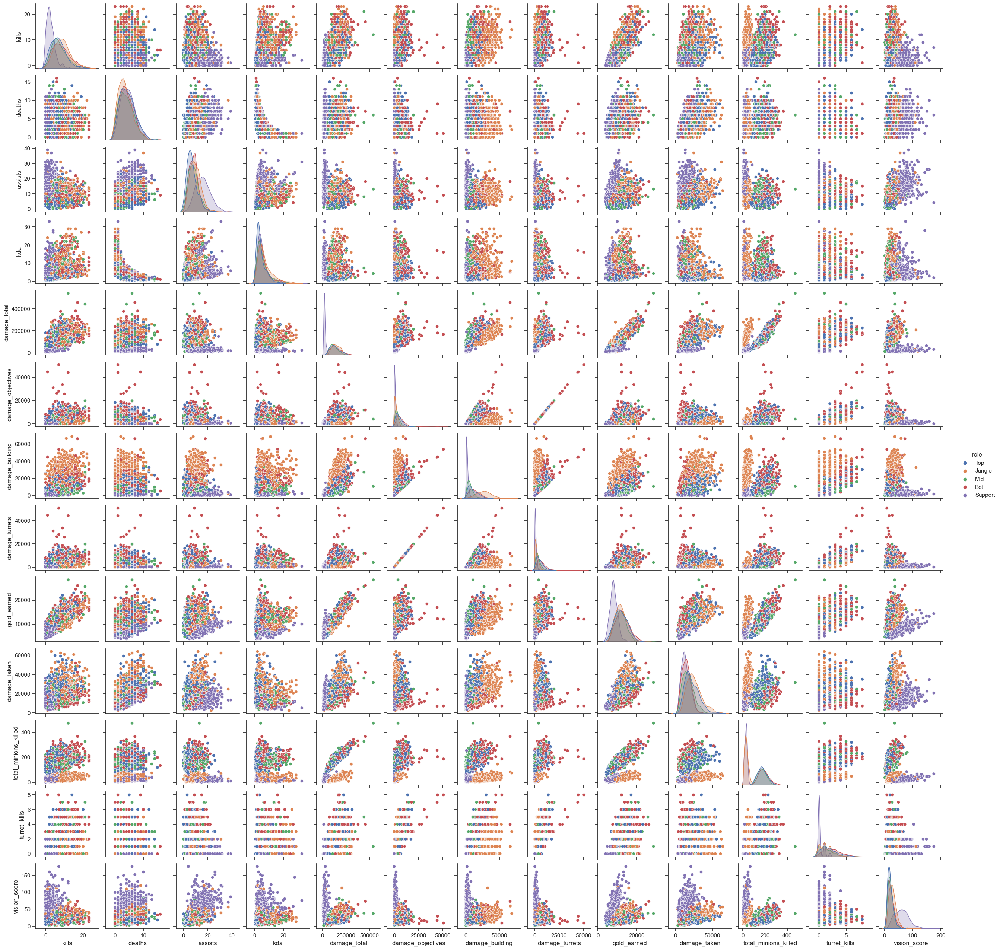

In [29]:
sns.set(style = 'ticks', color_codes = True)
sns.pairplot(win_lol, height = 2, hue = 'role', 
             vars = ['kills', 'deaths', 'assists', 'kda', 'damage_total', 
                     'damage_objectives', 'damage_building', 'damage_turrets', 'gold_earned',
                     'damage_taken', 'total_minions_killed', 'turret_kills', 'vision_score'], hue_order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'])
plt.show()

In [16]:
# damage_objectives & damage_turrets이 완벽한 선형관계에 있으므로 동일한 데이터로 판단, 제거
lol = lol.drop(['damage_turrets'], axis = 1)

lol

,champion,side,role,assists,damage_objectives,damage_building,deaths,gold_earned,kda,kills,level,time_cc,damage_total,damage_taken,total_minions_killed,turret_kills,vision_score,result
1,Udyr,Red,Jungle,8,547,46480,3,12919,6.666667,12,16.0,32,194463,25782,23,1,20,Win
2,Xerath,Red,Support,2,168,444,7,5641,0.285714,0,10.0,22,34038,14079,26,0,38,Lose
3,Zoe,Red,Mid,8,2492,3082,3,10688,5.000000,7,14.0,29,94369,11128,133,2,17,Win
4,Camille,Red,Top,8,6419,7408,5,12368,4.200000,13,15.0,25,110580,20404,141,2,24,Win
5,Alistar,Red,Support,14,625,1144,3,6471,5.000000,1,11.0,37,17852,11112,25,0,30,Win
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5692,Vex,Red,Mid,18,1361,12122,6,12178,4.166667,7,16.0,39,140108,20916,174,0,14,Lose
5693,Ezreal,Red,Bot,10,2097,21663,14,18347,1.285714,8,18.0,3,275357,35430,253,0,41,Lose
5694,Jayce,Red,Top,3,3426,5433,4,9262,1.500000,3,13.0,4,99117,10839,169,1,18,Win
5695,Nidalee,Red,Jungle,6,1249,15882,2,8863,7.500000,9,11.0,5,100611,14168,22,1,19,Win


In [ ]:
pd.crosstab(lol.result, lol.side, margins = True).style.background_gradient(cmap = 'rainbow')

side,Blue,Red,All
result,,,
Lose,1266,1320,2586
Win,1349,1383,2732
All,2615,2703,5318


In [ ]:
print("BLUE TEAM WIN RATE : {:.3f}".format(1349/2615))
print("RED TEAM WIN RATE : {:.3f}".format(1383/2703))

BLUE TEAM WIN RATE : 0.516
RED TEAM WIN RATE : 0.512


In [ ]:
pd.crosstab(win_lol.role, win_lol.kills).style.background_gradient(cmap = 'rainbow')

kills,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
role,,,,,,,,,,,,,,,,,,,,,,,,
Bot,2,16,25,46,37,43,55,47,40,43,39,35,28,19,20,8,18,14,7,3,2,3,0,4
Jungle,4,7,12,32,39,46,45,57,61,49,64,46,31,30,18,15,10,6,9,4,9,1,3,2
Mid,2,17,30,35,63,55,62,51,45,31,35,20,22,16,11,12,6,4,1,0,1,4,0,0
Support,87,104,131,77,77,31,22,7,4,13,2,2,4,1,0,0,0,0,0,0,0,0,0,0
Top,13,28,48,44,61,49,65,59,51,48,32,25,20,11,8,8,3,2,6,3,3,0,0,0


In [ ]:
pd.crosstab(lose_lol.role, lose_lol.kills).style.background_gradient(cmap = 'rainbow')

kills,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,21,22,24
role,,,,,,,,,,,,,,,,,,,,,,,
Bot,45,63,67,77,58,62,52,37,32,23,17,11,4,8,4,8,3,0,2,0,0,0,0
Jungle,7,29,57,60,78,54,63,44,35,35,25,12,21,3,8,1,6,6,1,1,1,1,0
Mid,38,74,101,89,79,47,52,29,31,22,20,3,8,0,2,2,2,2,2,0,1,0,1
Support,128,156,135,77,45,21,7,6,5,1,2,4,3,1,0,0,0,0,0,0,0,0,0
Top,42,77,99,82,73,46,48,35,7,19,11,3,5,2,2,0,1,2,0,0,0,0,0


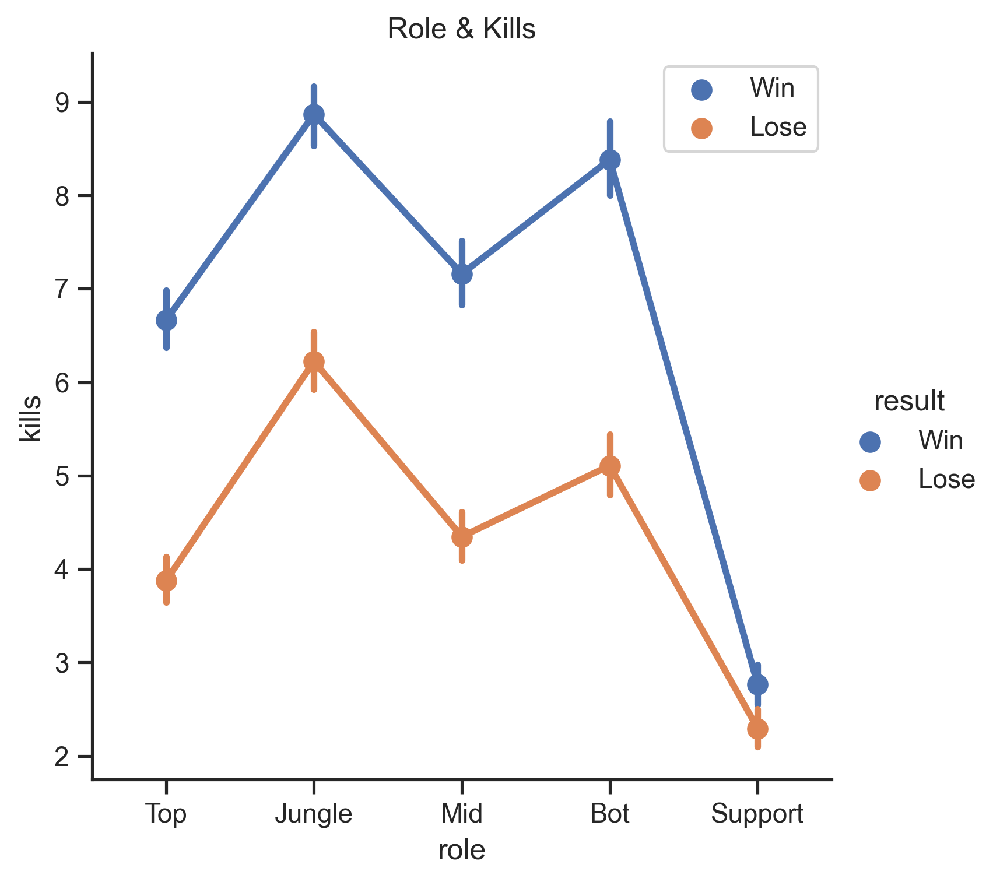

In [ ]:
sns.factorplot('role', 'kills', data = lol, hue = 'result',
               order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'])
plt.legend()
plt.title("Role & Kills");

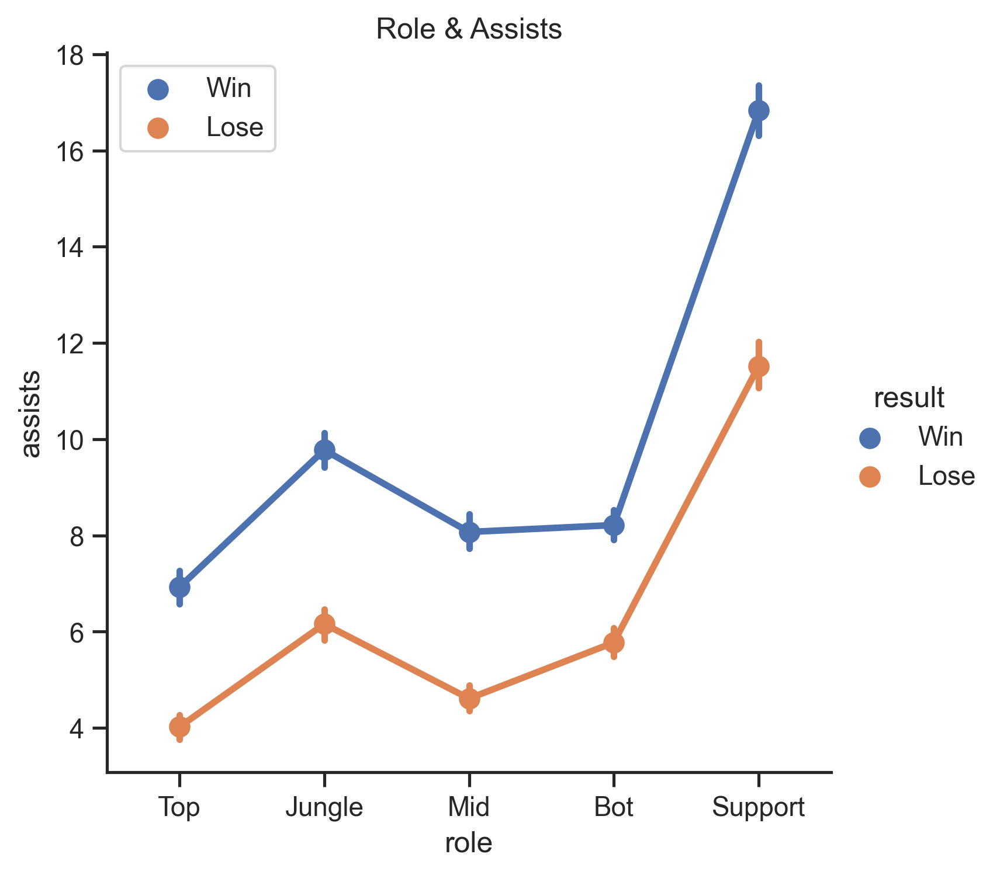

In [ ]:
sns.factorplot('role', 'assists', data = lol, hue = 'result', 
               order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'])
plt.legend()
plt.title("Role & Assists");

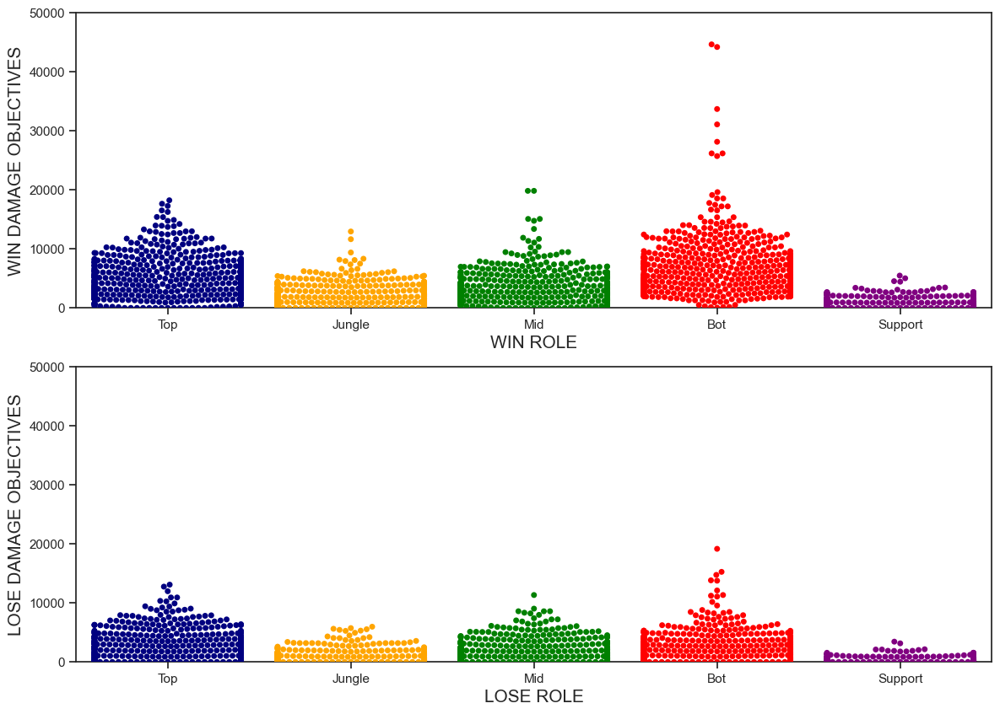

In [31]:
plt.rcParams['figure.figsize'] = (14, 10)
my_palette = {"Top":"navy","Jungle":"orange","Mid":"green","Bot":"red","Support":"purple"}

ax1 = plt.subplot(211)
swarm2 = sns.swarmplot(x = win_lol['role'], y = win_lol['damage_objectives'],
                       order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'],
                       palette = my_palette)
plt.xlabel("WIN ROLE", fontsize = 15)
plt.ylabel("WIN DAMAGE OBJECTIVES", fontsize = 15)
plt.ylim(0, 50000)

ax2 = plt.subplot(212)
swarm2 = sns.swarmplot(x = lose_lol['role'], y = lose_lol['damage_objectives'],
                       order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'],
                       palette = my_palette)
plt.xlabel("LOSE ROLE", fontsize = 15)
plt.ylabel("LOSE DAMAGE OBJECTIVES", fontsize = 15)
plt.ylim(0, 50000)
plt.show();

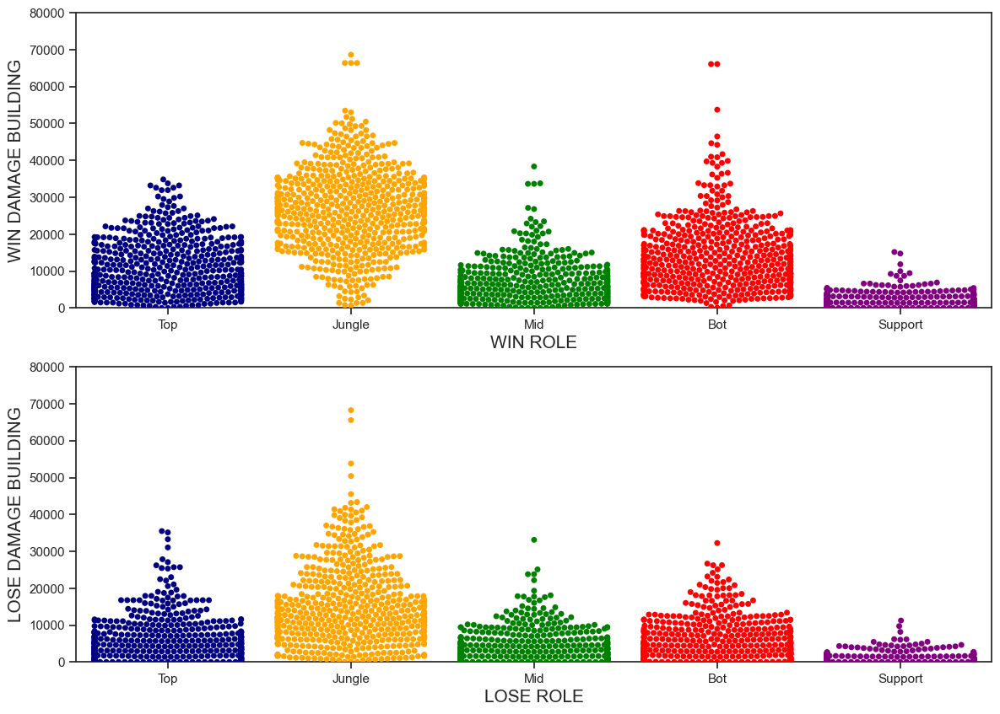

<Figure size 1400x1000 with 0 Axes>

In [32]:
plt.rcParams['figure.figsize'] = (14, 10)
my_palette = {"Top":"navy","Jungle":"orange","Mid":"green","Bot":"red","Support":"purple"}

ax1 = plt.subplot(211)
swarm1 = sns.swarmplot(x = win_lol['role'], y = win_lol['damage_building'],
                       order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'],
                       palette = my_palette)
plt.xlabel("WIN ROLE", fontsize = 15)
plt.ylabel("WIN DAMAGE BUILDING", fontsize = 15)
plt.ylim(0, 80000)


ax2 = plt.subplot(212)
swarm1 = sns.swarmplot(x = lose_lol['role'], y = lose_lol['damage_building'],
                       order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'],
                       palette = my_palette)
plt.xlabel("LOSE ROLE", fontsize = 15)
plt.ylabel("LOSE DAMAGE BUILDING", fontsize = 15)
plt.ylim(0, 80000)

plt.show()
plt.savefig('C:/Users/hanyj/p_data/lol_image')

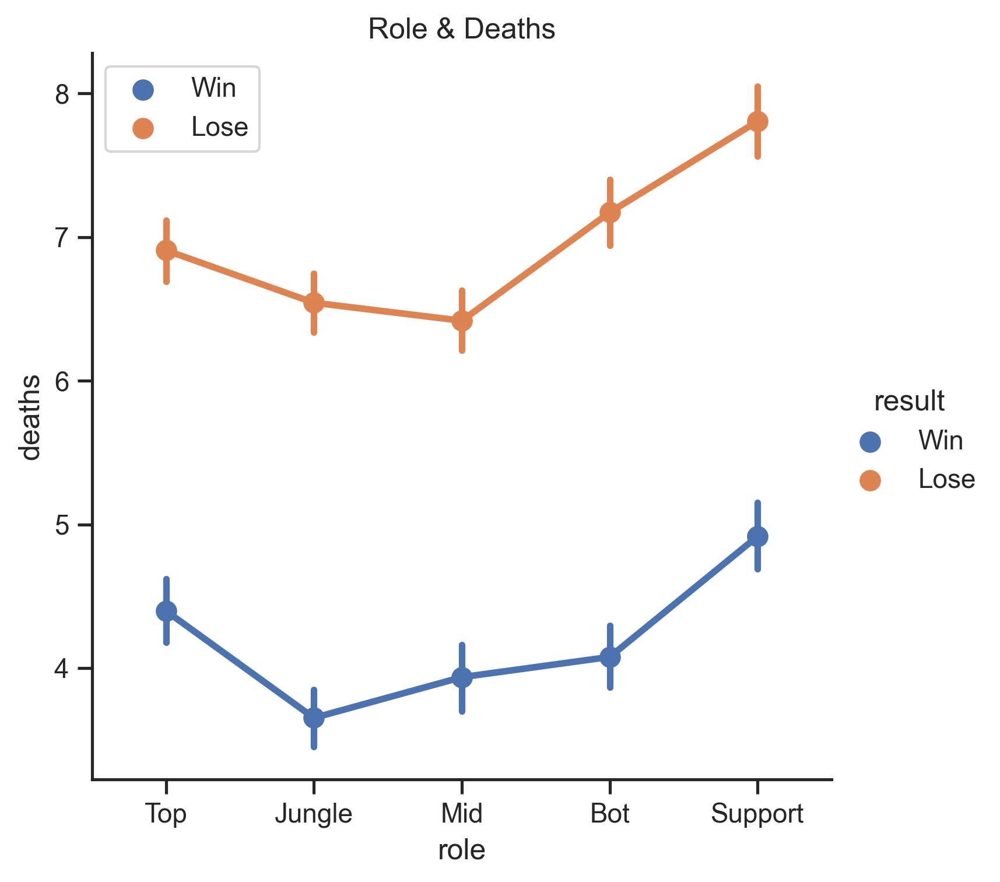

In [ ]:
sns.factorplot('role', 'deaths', data = lol, hue = 'result', order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'])
plt.legend()
plt.title('Role & Deaths');

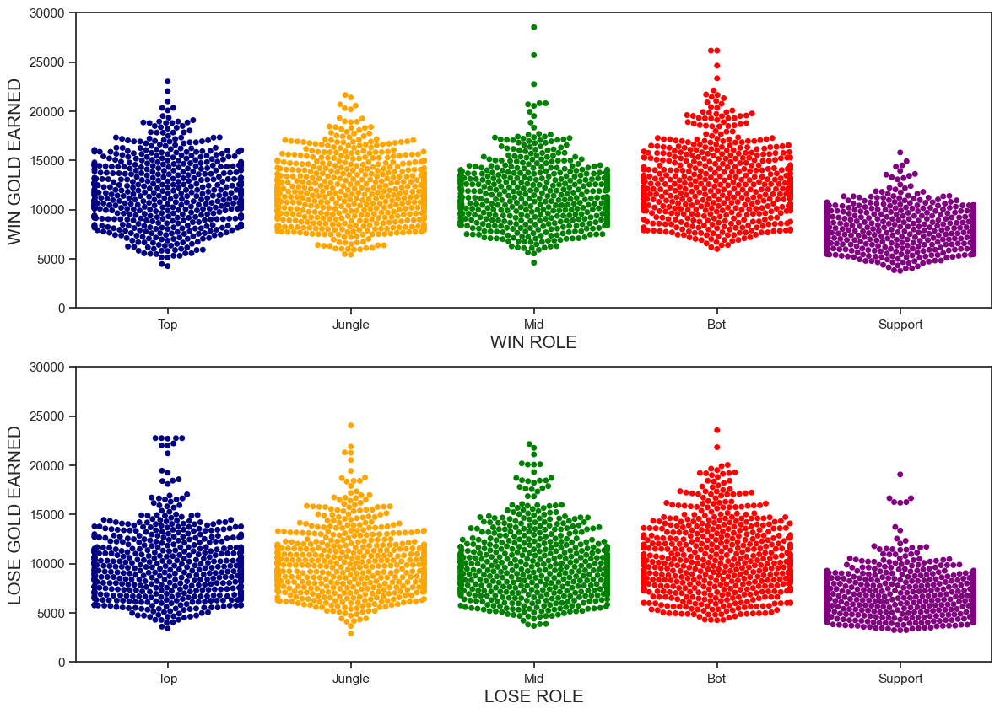

In [33]:
plt.rcParams['figure.figsize'] = (14, 10)
my_palette = {"Top":"navy","Jungle":"orange","Mid":"green","Bot":"red","Support":"purple"}

ax1 = plt.subplot(211)
swarm1 = sns.swarmplot(x = win_lol['role'], y = win_lol['gold_earned'],
                       order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'],
                       palette = my_palette)
plt.xlabel("WIN ROLE", fontsize = 15)
plt.ylabel("WIN GOLD EARNED", fontsize = 15)
plt.ylim(0, 30000)


ax2 = plt.subplot(212)
swarm1 = sns.swarmplot(x = lose_lol['role'], y = lose_lol['gold_earned'],
                       order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'],
                       palette = my_palette)
plt.xlabel("LOSE ROLE", fontsize = 15)
plt.ylabel("LOSE GOLD EARNED", fontsize = 15)
plt.ylim(0, 30000)

plt.show()

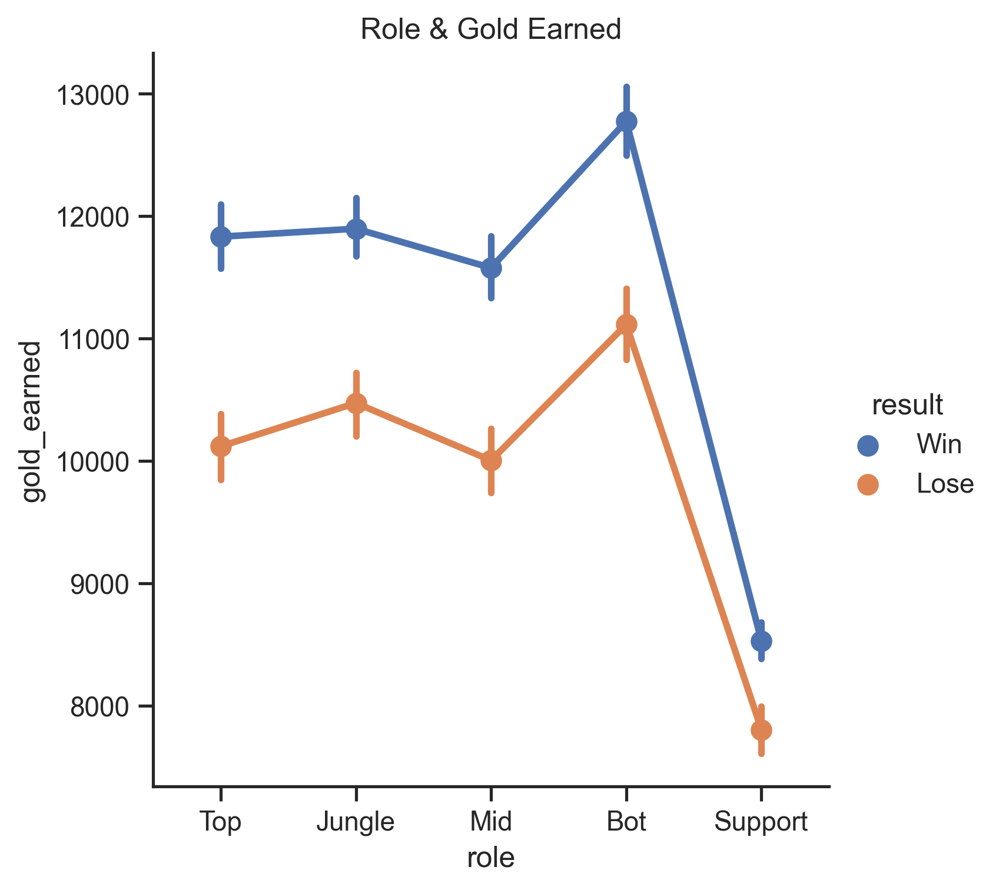

In [ ]:
sns.factorplot('role', 'gold_earned', data = lol, hue = 'result',
               order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'])
plt.title("Role & Gold Earned")
plt.show()

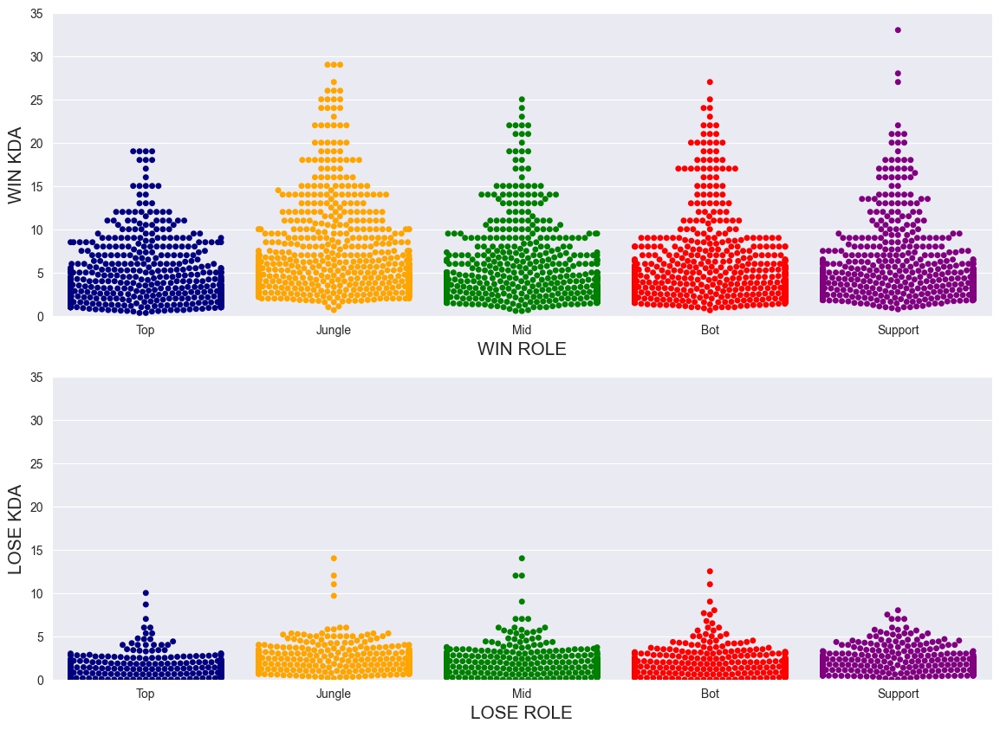

In [17]:
plt.rcParams['figure.figsize'] = (14, 10)
my_palette = {"Top":"navy","Jungle":"orange","Mid":"green","Bot":"red","Support":"purple"}

ax1 = plt.subplot(211)
swarm1 = sns.swarmplot(x = win_lol['role'], y = win_lol['kda'],
                       order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'],
                       palette = my_palette)
plt.xlabel("WIN ROLE", fontsize = 15)
plt.ylabel("WIN KDA", fontsize = 15)
plt.ylim(0, 35)


ax2 = plt.subplot(212)
swarm1 = sns.swarmplot(x = lose_lol['role'], y = lose_lol['kda'],
                       order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'],
                       palette = my_palette)
plt.xlabel("LOSE ROLE", fontsize = 15)
plt.ylabel("LOSE KDA", fontsize = 15)
plt.ylim(0, 35)

plt.show()

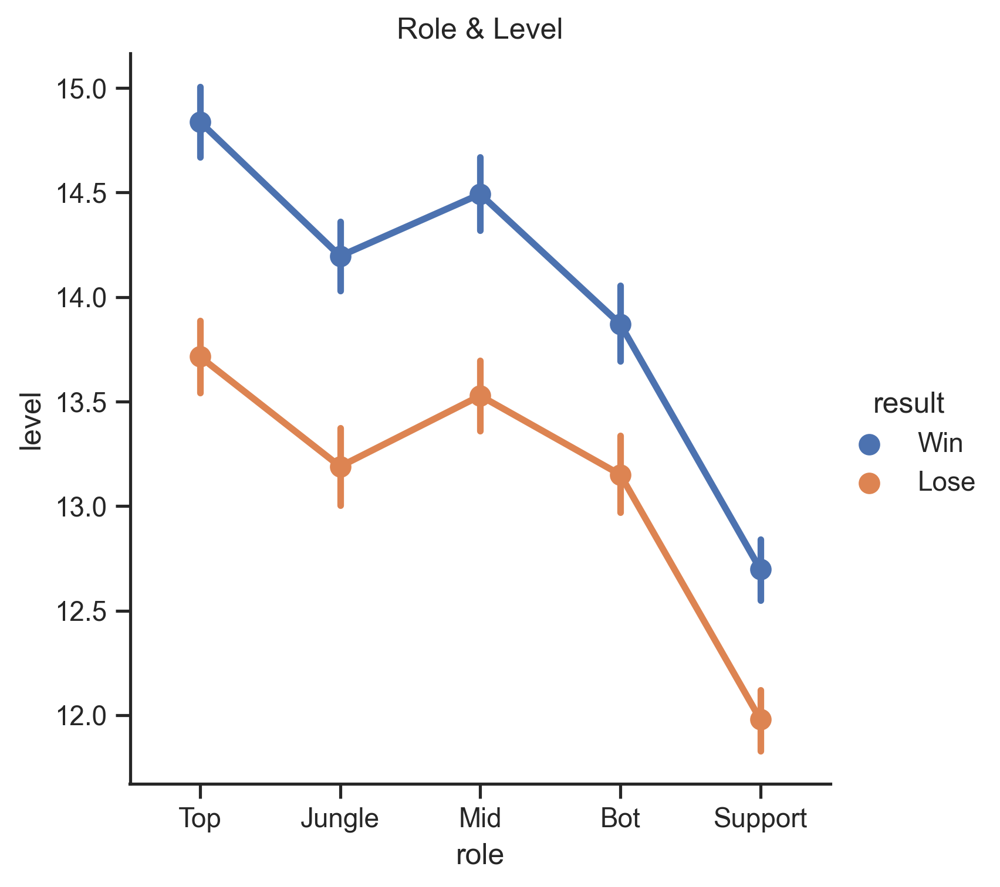

In [ ]:
sns.factorplot('role', 'level', data = lol, hue = 'result', 
               order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'])
plt.title("Role & Level")
plt.show();

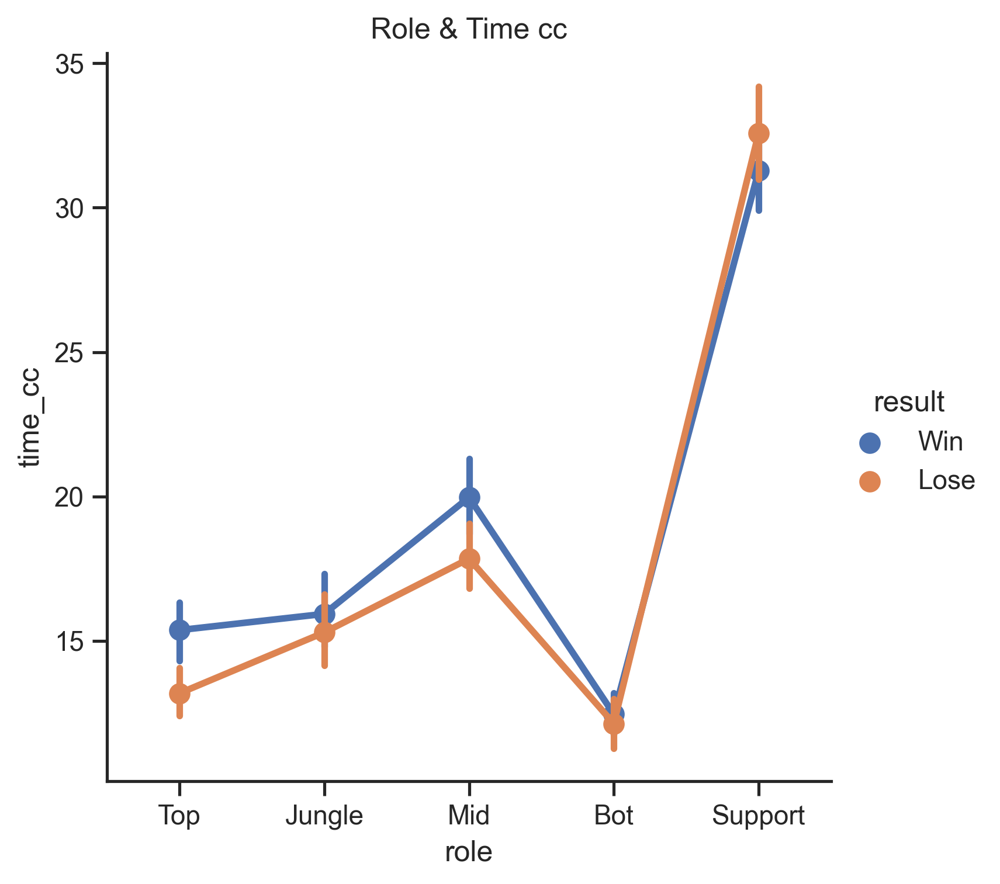

In [ ]:
sns.factorplot('role', 'time_cc', data = lol, hue = 'result', 
               order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'])
plt.title('Role & Time cc')
plt.show()

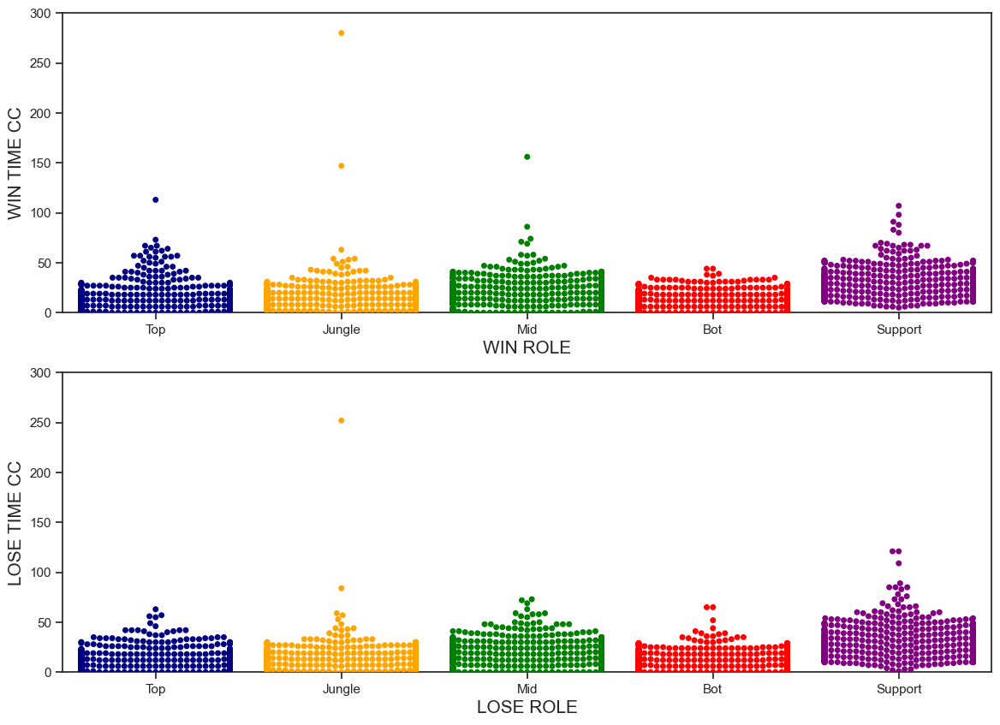

In [35]:
plt.rcParams['figure.figsize'] = (14, 10)
my_palette = {"Top":"navy","Jungle":"orange","Mid":"green","Bot":"red","Support":"purple"}

# time_cc : time crowd controlling others

ax1 = plt.subplot(211)
swarm1 = sns.swarmplot(x = win_lol['role'], y = win_lol['time_cc'],
                       order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'],
                       palette = my_palette)
plt.xlabel("WIN ROLE", fontsize = 15)
plt.ylabel("WIN TIME CC", fontsize = 15)
plt.ylim(0, 300)


ax2 = plt.subplot(212)
swarm1 = sns.swarmplot(x = lose_lol['role'], y = lose_lol['time_cc'],
                       order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'],
                       palette = my_palette)
plt.xlabel("LOSE ROLE", fontsize = 15)
plt.ylabel("LOSE TIME CC", fontsize = 15)
plt.ylim(0, 300)

plt.show()

In [ ]:
print(win_lol.loc[win_lol['time_cc'] > 100]['champion'], '\n')
print(lose_lol.loc[lose_lol['time_cc'] > 100]['champion'])

# outlier -> 플레이어의 실력 및 게임의 상황에 따라 다양해질 요인이 충분한 데이터 -> 무시

592     Nocturne
2284      Gragas
3311    Nocturne
4363    Nautilus
4656    Nocturne
Name: champion, dtype: object 

591     Nocturne
908      Alistar
2929      Maokai
4132     Alistar
Name: champion, dtype: object


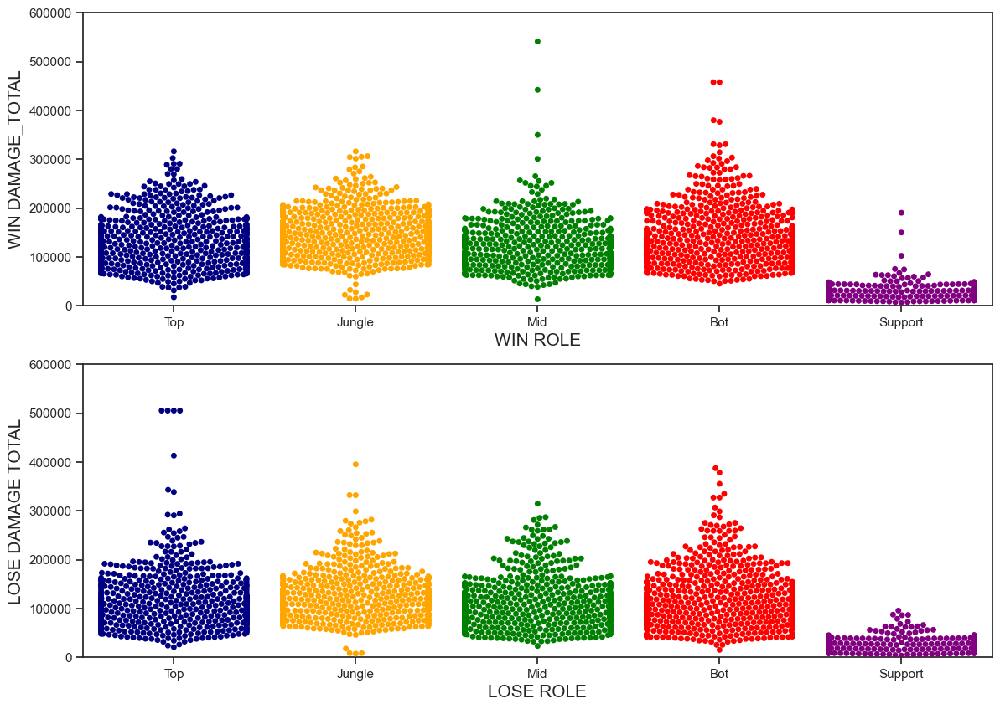

In [36]:
plt.rcParams['figure.figsize'] = (14, 10)
my_palette = {"Top":"navy","Jungle":"orange","Mid":"green","Bot":"red","Support":"purple"}

ax1 = plt.subplot(211)
swarm2 = sns.swarmplot(x = win_lol['role'], y = win_lol['damage_total'],
                       order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'],
                       palette = my_palette)
plt.xlabel("WIN ROLE", fontsize = 15)
plt.ylabel("WIN DAMAGE_TOTAL", fontsize = 15)
plt.ylim(0,600000)

ax2 = plt.subplot(212)
swarm2 = sns.swarmplot(x = lose_lol['role'], y = lose_lol['damage_total'],
                       order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'],
                       palette = my_palette)
plt.xlabel("LOSE ROLE", fontsize = 15)
plt.ylabel("LOSE DAMAGE TOTAL", fontsize = 15)
plt.ylim(0,600000)

plt.show()

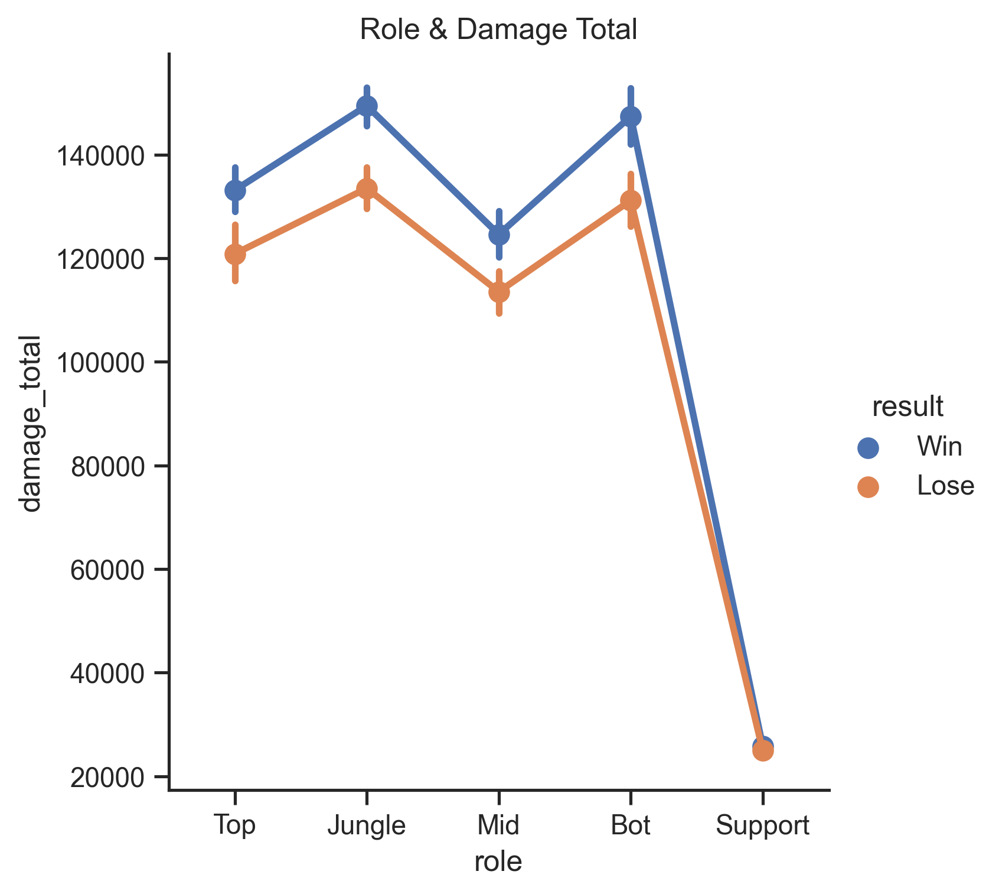

In [ ]:
sns.factorplot('role', 'damage_total', data = lol, hue = 'result', 
               order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'])
plt.title("Role & Damage Total")
plt.show()

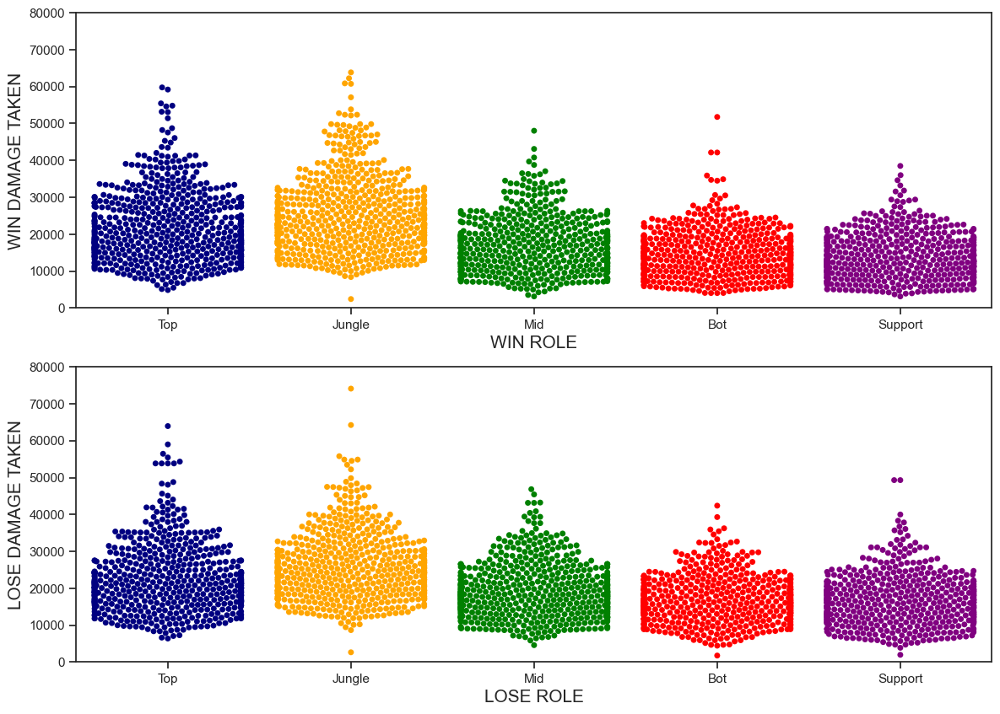

In [37]:
plt.rcParams['figure.figsize'] = (14, 10)
my_palette = {"Top":"navy","Jungle":"orange","Mid":"green","Bot":"red","Support":"purple"}

ax1 = plt.subplot(211)
swarm1 = sns.swarmplot(x = win_lol['role'], y = win_lol['damage_taken'],
                       order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'],
                       palette = my_palette)
plt.xlabel("WIN ROLE", fontsize = 15)
plt.ylabel("WIN DAMAGE TAKEN", fontsize = 15)
plt.ylim(0, 80000)


ax2 = plt.subplot(212)
swarm1 = sns.swarmplot(x = lose_lol['role'], y = lose_lol['damage_taken'],
                       order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'],
                       palette = my_palette)
plt.xlabel("LOSE ROLE", fontsize = 15)
plt.ylabel("LOSE DAMAGE TAKEN", fontsize = 15)
plt.ylim(0, 80000)

plt.show()

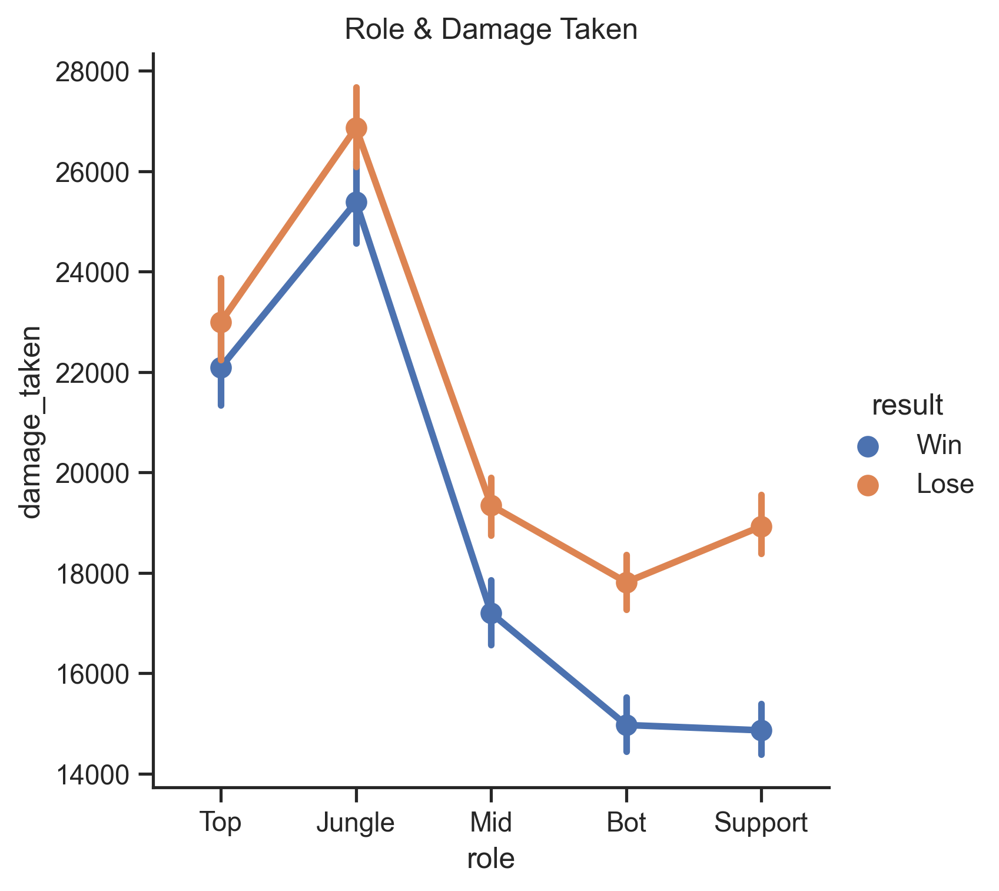

In [ ]:
sns.factorplot('role', 'damage_taken', data = lol, hue = 'result', 
               order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'])
plt.title("Role & Damage Taken")
plt.show()

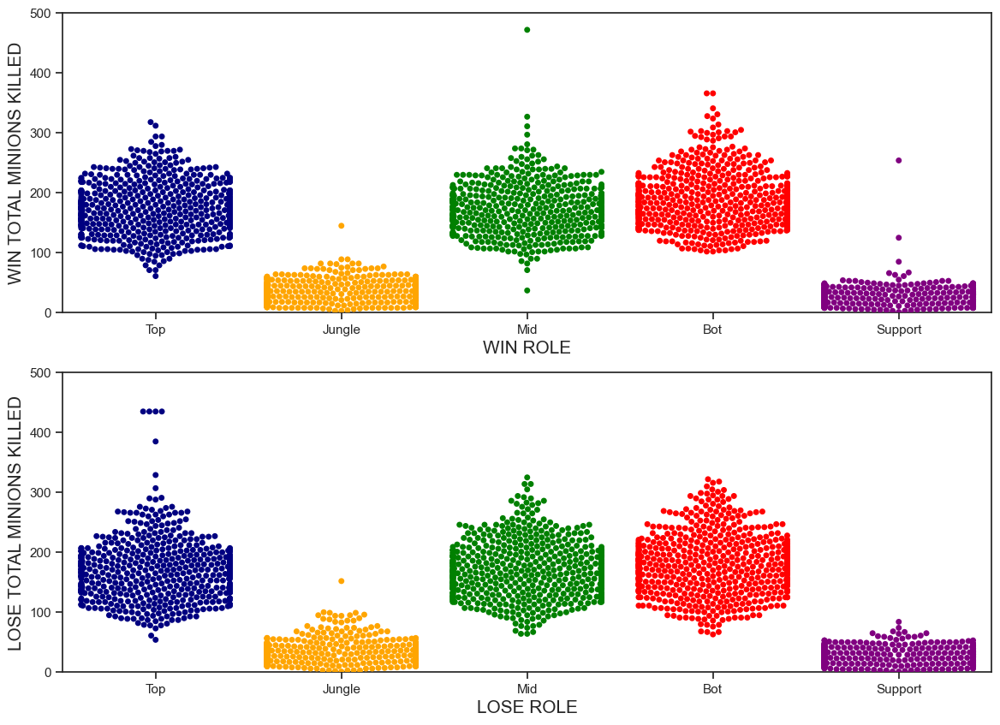

In [38]:
plt.rcParams['figure.figsize'] = (14, 10)
my_palette = {"Top":"navy","Jungle":"orange","Mid":"green","Bot":"red","Support":"purple"}

ax1 = plt.subplot(211)
swarm1 = sns.swarmplot(x = win_lol['role'], y = win_lol['total_minions_killed'],
                       order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'],
                       palette = my_palette)
plt.xlabel("WIN ROLE", fontsize = 15)
plt.ylabel("WIN TOTAL MINIONS KILLED", fontsize = 15)
plt.ylim(0, 500)

ax2 = plt.subplot(212)
swarm2 = sns.swarmplot(x = lose_lol['role'], y = lose_lol['total_minions_killed'],
                       order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'],
                       palette = my_palette)
plt.xlabel("LOSE ROLE", fontsize = 15)
plt.ylabel("LOSE TOTAL MINIONS KILLED", fontsize = 15)
plt.ylim(0, 500)

plt.show()

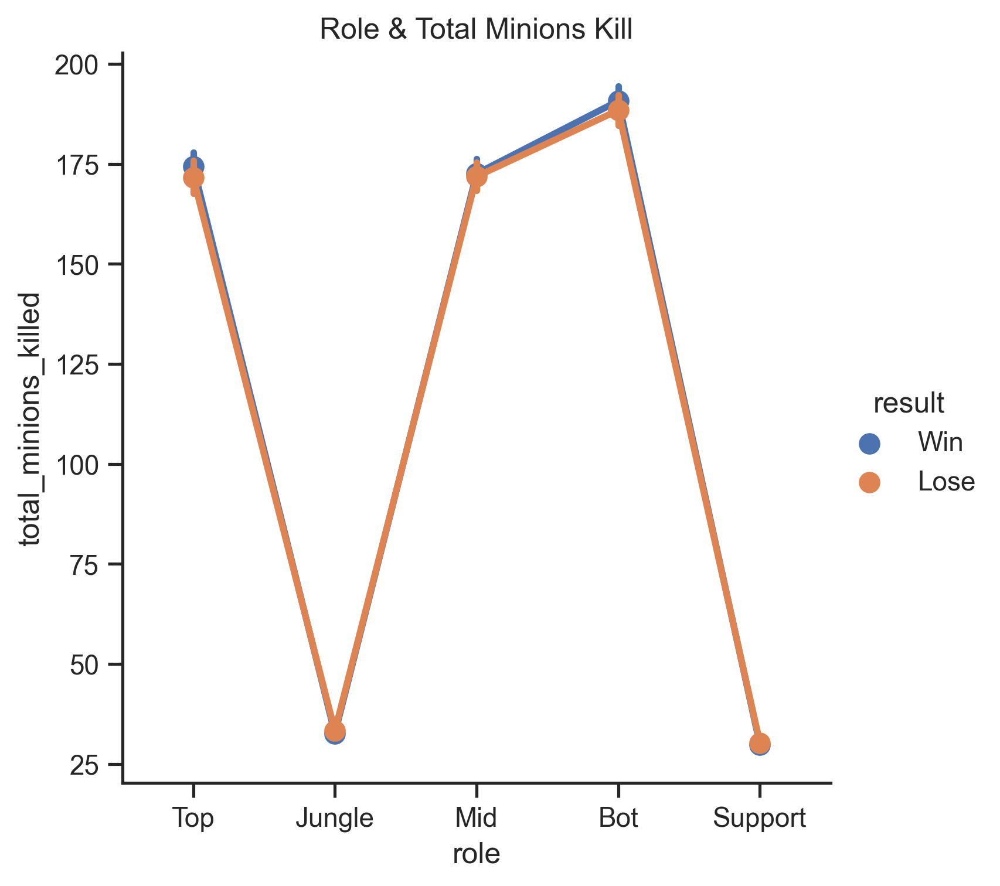

In [ ]:
sns.factorplot('role', 'total_minions_killed', data = lol, hue = 'result', 
               order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'])
plt.title("Role & Total Minions Kill")
plt.show()

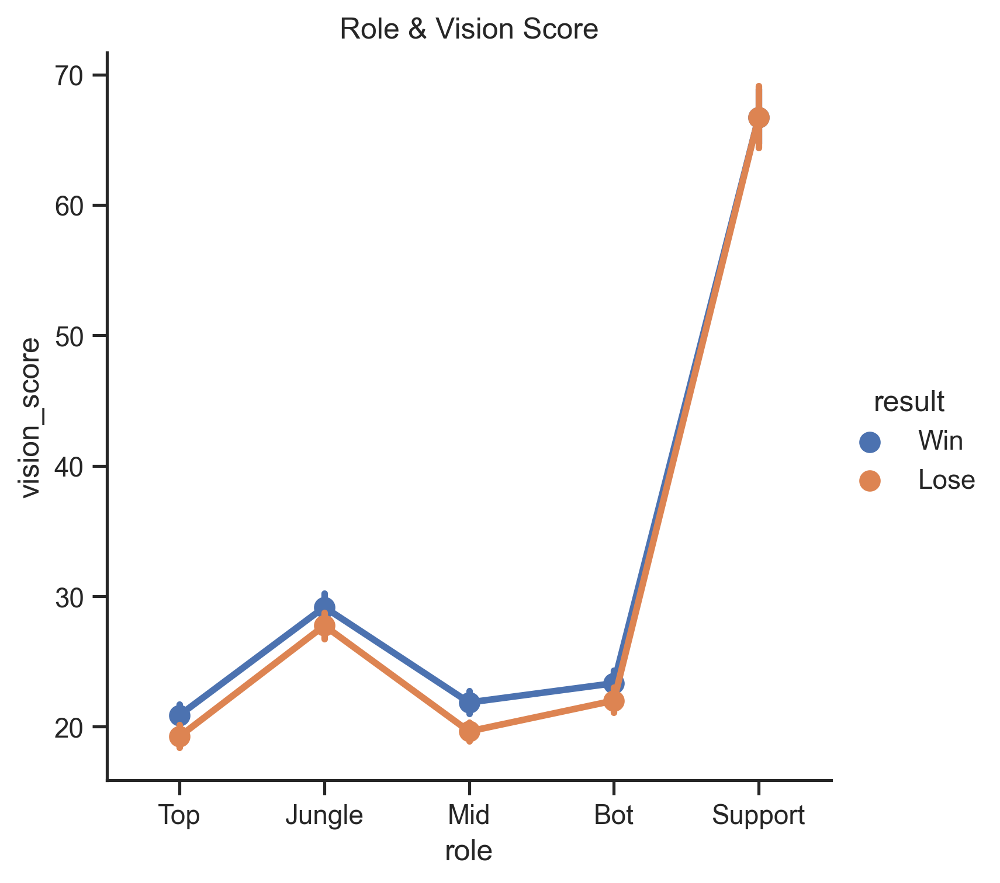

In [ ]:
sns.factorplot('role', 'vision_score', data = lol, hue = 'result',
               order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'])
plt.title("Role & Vision Score")
plt.show()

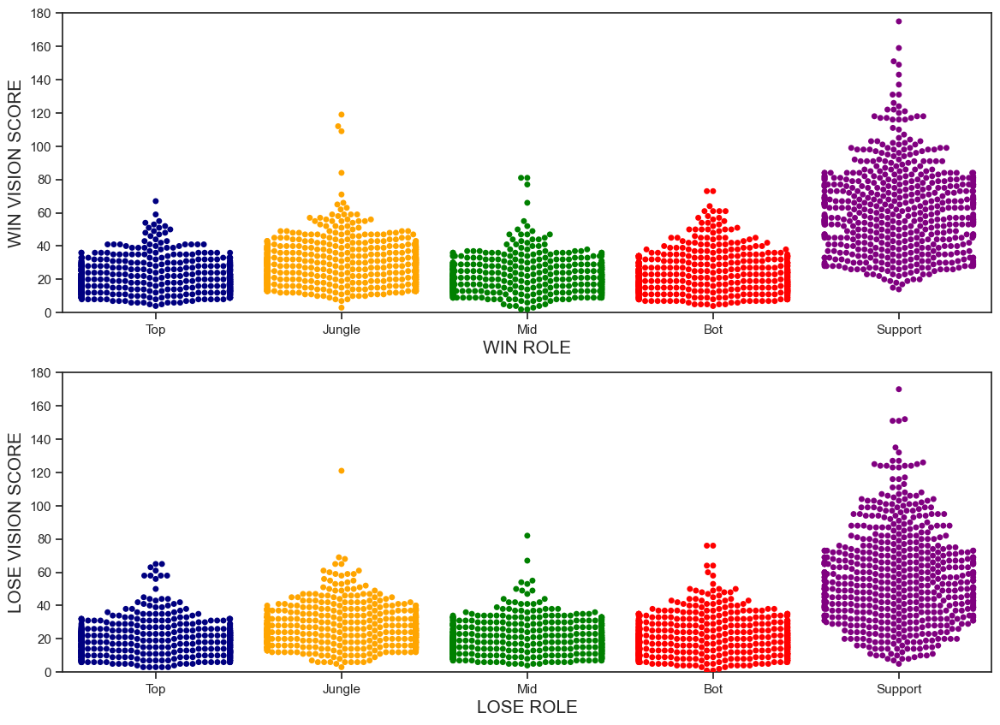

In [39]:
plt.rcParams['figure.figsize'] = (14, 10)
my_palette = {"Top":"navy","Jungle":"orange","Mid":"green","Bot":"red","Support":"purple"}

ax1 = plt.subplot(211)
swarm1 = sns.swarmplot(x = win_lol['role'], y = win_lol['vision_score'],
                       order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'],
                       palette = my_palette)
plt.xlabel("WIN ROLE", fontsize = 15)
plt.ylabel("WIN VISION SCORE", fontsize = 15)
plt.ylim(0, 180)


ax2 = plt.subplot(212)
swarm1 = sns.swarmplot(x = lose_lol['role'], y = lose_lol['vision_score'],
                       order = ['Top', 'Jungle', 'Mid', 'Bot', 'Support'],
                       palette = my_palette)
plt.xlabel("LOSE ROLE", fontsize = 15)
plt.ylabel("LOSE VISION SCORE", fontsize = 15)
plt.ylim(0, 180)

plt.show()

칼럼별 분포 확인 및 머신러닝을 위한 사전 작업

In [ ]:
lol.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5318 entries, 1 to 5696
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   champion              5318 non-null   object 
 1   side                  5318 non-null   object 
 2   role                  5318 non-null   object 
 3   assists               5318 non-null   int64  
 4   damage_objectives     5318 non-null   int64  
 5   damage_building       5318 non-null   int64  
 6   deaths                5318 non-null   int64  
 7   gold_earned           5318 non-null   int64  
 8   kda                   5318 non-null   float64
 9   kills                 5318 non-null   int64  
 10  level                 5318 non-null   float64
 11  time_cc               5318 non-null   int64  
 12  damage_total          5318 non-null   int64  
 13  damage_taken          5318 non-null   int64  
 14  total_minions_killed  5318 non-null   int64  
 15  turret_kills         

In [41]:
lol['kda'] = lol['kda'].astype(np.int64)
lol['level'] = lol['level'].astype(np.int64)
lol.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5318 entries, 1 to 5696
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   champion              5318 non-null   object
 1   side                  5318 non-null   object
 2   role                  5318 non-null   object
 3   assists               5318 non-null   int64 
 4   damage_objectives     5318 non-null   int64 
 5   damage_building       5318 non-null   int64 
 6   deaths                5318 non-null   int64 
 7   gold_earned           5318 non-null   int64 
 8   kda                   5318 non-null   int64 
 9   kills                 5318 non-null   int64 
 10  level                 5318 non-null   int64 
 11  time_cc               5318 non-null   int64 
 12  damage_total          5318 non-null   int64 
 13  damage_taken          5318 non-null   int64 
 14  total_minions_killed  5318 non-null   int64 
 15  turret_kills          5318 non-null   int64

In [42]:
# champion & role -> EDA로 확인 완료

except_lol = lol.drop(columns = ['champion', 'side'], axis = 1)

except_lol['result'] = except_lol['result'].replace('Win', 1)
except_lol['result'] = except_lol['result'].replace('Lose', 0)


Top_data = except_lol[except_lol['role'] == 'Top']
Jungle_data = except_lol[except_lol['role'] == 'Jungle']
Mid_data = except_lol[except_lol['role'] == 'Mid']
Bot_data = except_lol[except_lol['role'] == 'Bot']
Support_data = except_lol[except_lol['role'] == 'Support']

Top_data = Top_data.drop(columns = ['role'], axis = 1)
Jungle_data = Jungle_data.drop(columns = ['role'], axis = 1)
Mid_data = Mid_data.drop(columns = ['role'], axis = 1)
Bot_data = Bot_data.drop(columns = ['role'], axis = 1)
Support_data = Support_data.drop(columns = ['role'], axis = 1)

In [ ]:
Top_data

,assists,damage_objectives,damage_building,deaths,gold_earned,kda,kills,level,time_cc,damage_total,damage_taken,total_minions_killed,turret_kills,vision_score,result
4,8,6419,7408,5,12368,4,13,15,25,110580,20404,141,2,24,1
14,3,4207,5705,4,9121,1,4,13,12,102586,20290,153,2,6,0
18,9,5276,17111,9,18569,2,12,18,10,254391,32040,273,0,27,0
20,3,1534,5413,6,10306,1,3,14,10,123007,16442,181,0,30,1
30,14,1659,3681,4,15960,5,8,18,45,161825,38449,217,1,28,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5675,2,2322,2322,4,9167,2,7,13,14,79963,17929,127,1,9,1
5677,7,2268,5814,7,11619,1,4,15,0,127010,17424,196,1,32,0
5678,4,0,4077,11,8024,0,3,13,15,97196,22093,137,0,21,0
5688,2,2654,18778,2,9404,3,5,13,7,120169,13610,159,2,23,1


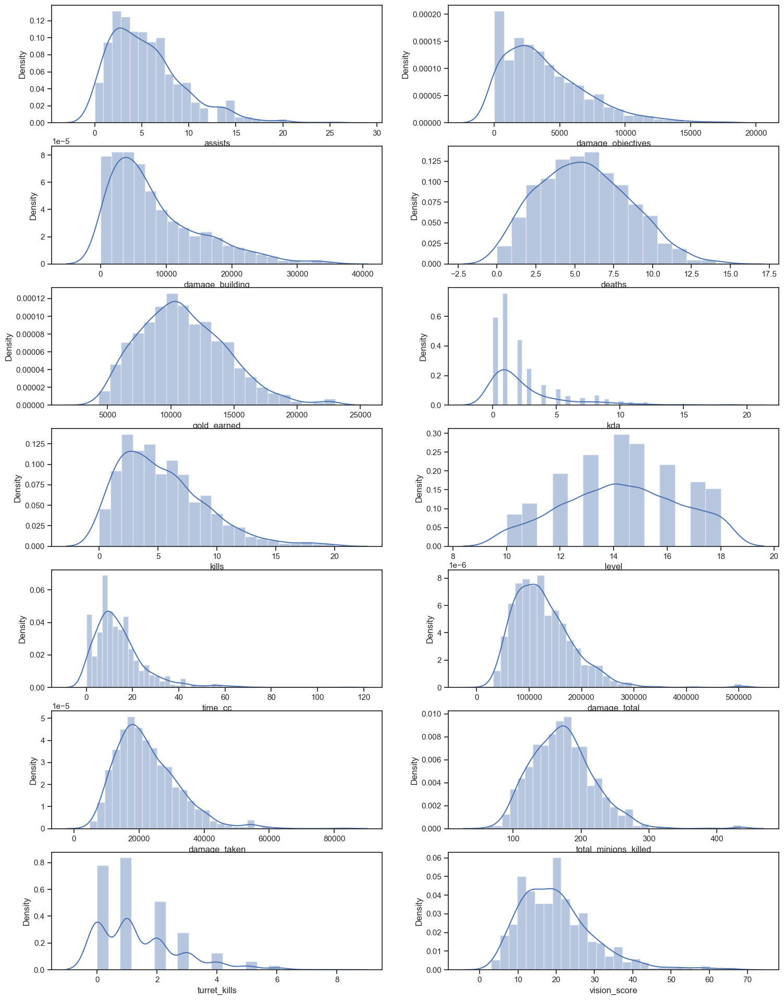

In [43]:
col = Top_data.drop(['result'], axis = 1).columns

row_index = [0,0,1,1,2,2,3,3,4,4,5,5,6,6]
col_index = [0,1,0,1,0,1,0,1,0,1,0,1,0,1]

fig, ax = plt.subplots(nrows = 7, ncols = 2, figsize = (18, 24))

for col, r, c in zip(col, row_index, col_index):
    sns.distplot(Top_data[col], kde = True, ax = ax[r][c])

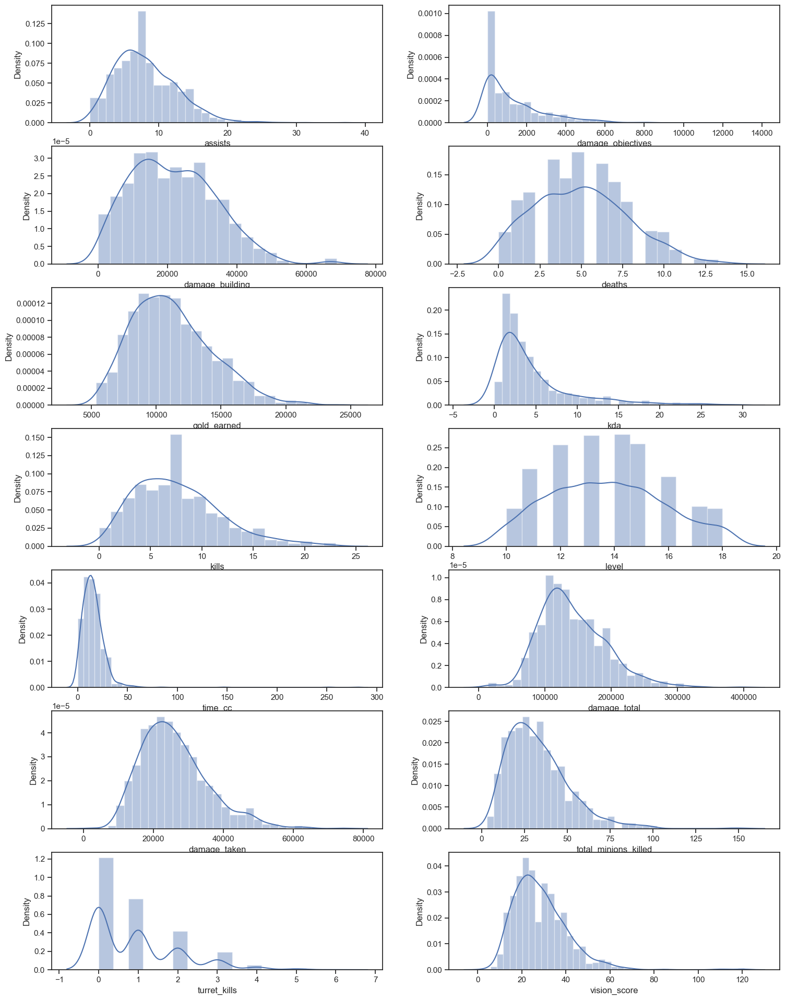

In [44]:
col = Jungle_data.drop(['result'], axis = 1).columns

row_index = [0,0,1,1,2,2,3,3,4,4,5,5,6,6]
col_index = [0,1,0,1,0,1,0,1,0,1,0,1,0,1]

fig, ax = plt.subplots(nrows = 7, ncols = 2, figsize = (18, 24))

for col, r, c in zip(col, row_index, col_index):
    sns.distplot(Jungle_data[col], kde = True, ax = ax[r][c])

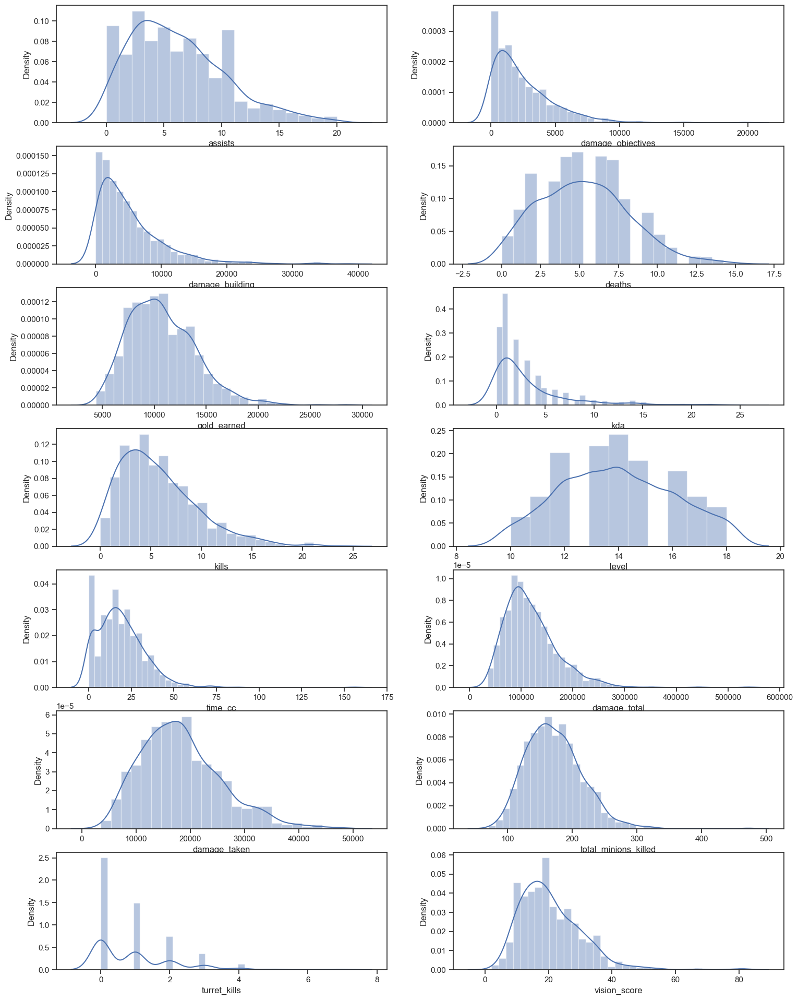

In [45]:
col = Mid_data.drop(['result'], axis = 1).columns

row_index = [0,0,1,1,2,2,3,3,4,4,5,5,6,6]
col_index = [0,1,0,1,0,1,0,1,0,1,0,1,0,1]

fig, ax = plt.subplots(nrows = 7, ncols = 2, figsize = (18, 24))

for col, r, c in zip(col, row_index, col_index):
    sns.distplot(Mid_data[col], kde = True, ax = ax[r][c])

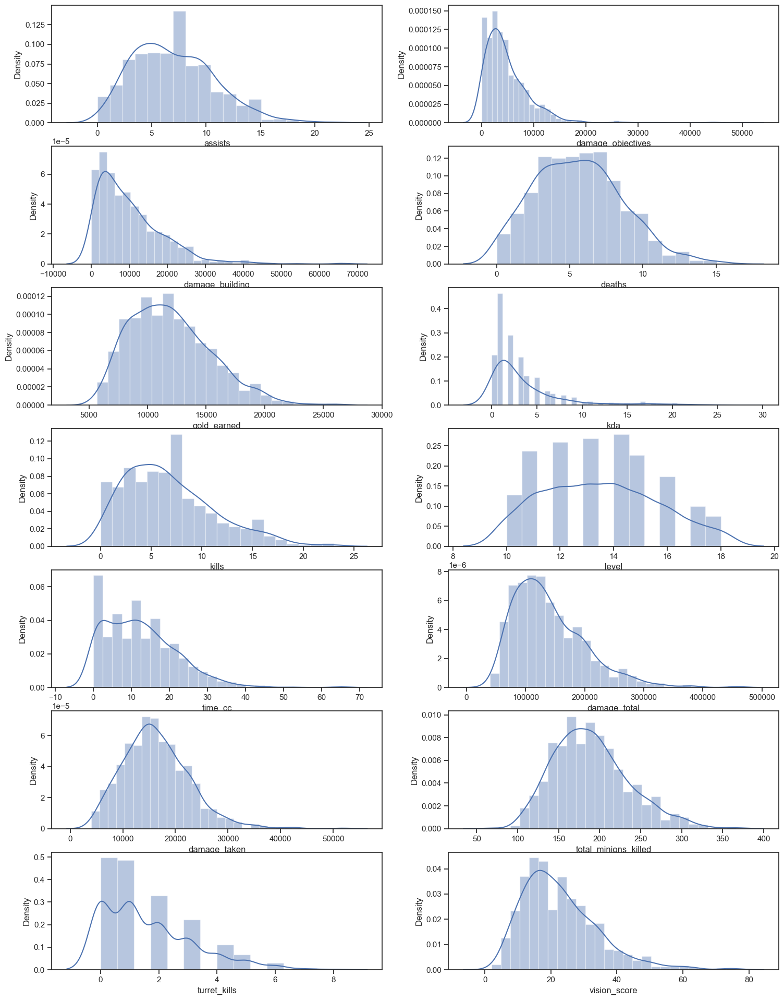

In [46]:
col = Bot_data.drop(['result'], axis = 1).columns

row_index = [0,0,1,1,2,2,3,3,4,4,5,5,6,6]
col_index = [0,1,0,1,0,1,0,1,0,1,0,1,0,1]

fig, ax = plt.subplots(nrows = 7, ncols = 2, figsize = (18, 24))

for col, r, c in zip(col, row_index, col_index):
    sns.distplot(Bot_data[col], kde = True, ax = ax[r][c])

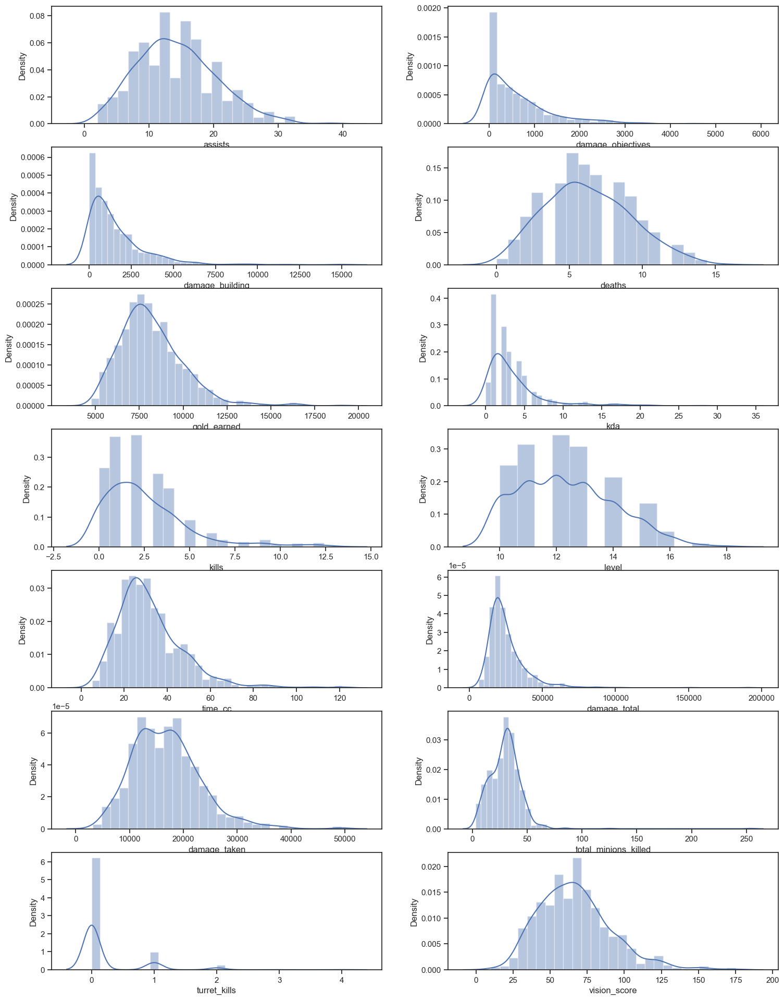

In [47]:
col = Support_data.drop(['result'], axis = 1).columns

row_index = [0,0,1,1,2,2,3,3,4,4,5,5,6,6]
col_index = [0,1,0,1,0,1,0,1,0,1,0,1,0,1]

fig, ax = plt.subplots(nrows = 7, ncols = 2, figsize = (18, 24))

for col, r, c in zip(col, row_index, col_index):
    sns.distplot(Support_data[col], kde = True, ax = ax[r][c])

라인별 변수들 간의 다중공선성 확인

In [ ]:
y, x = dmatrices('result ~ kda + damage_objectives + damage_building + damage_total + damage_taken + total_minions_killed + vision_score + assists + gold_earned + time_cc + kills + turret_kills + level + deaths', 
                 Top_data, return_type = 'dataframe')
vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif['features'] = x.columns
vif

,VIF Factor,features
0,114.770198,Intercept
1,2.776344,kda
2,4.317340,damage_objectives
3,3.542060,damage_building
4,15.113765,damage_total
5,2.617759,damage_taken
6,12.410028,total_minions_killed
7,2.027918,vision_score
8,2.674884,assists
9,36.949574,gold_earned


In [ ]:
# 가장 높았던 gold earned와 factoplot에서 승리 여부에 전혀 기여를 하지 않는 것으로 보인 total_minions_killed 삭제

y, x = dmatrices('result ~ kda + damage_objectives + damage_building + damage_total + damage_taken + vision_score + assists + time_cc + kills + turret_kills + level + deaths', 
                 Top_data, return_type = 'dataframe')
vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif['features'] = x.columns
vif

,VIF Factor,features
0,113.619383,Intercept
1,2.753603,kda
2,4.134768,damage_objectives
3,3.060825,damage_building
4,4.534464,damage_total
5,2.588550,damage_taken
6,1.866741,vision_score
7,2.003937,assists
8,1.450791,time_cc
9,2.060866,kills


In [ ]:
y, x = dmatrices('result ~ kda + damage_objectives + damage_building + damage_total + damage_taken + total_minions_killed + vision_score + assists + gold_earned + time_cc + kills + turret_kills + level + deaths', 
                 Jungle_data, return_type = 'dataframe')
vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif['features'] = x.columns
vif

,VIF Factor,features
0,128.206573,Intercept
1,2.862846,kda
2,1.927244,damage_objectives
3,2.799721,damage_building
4,8.917908,damage_total
5,3.066745,damage_taken
6,2.197545,total_minions_killed
7,1.835687,vision_score
8,2.062839,assists
9,20.482675,gold_earned


In [ ]:
# 가장 높았던 gold earned 삭제
# total_minions_killed는 factorplot에서도 차이가 크지 않았으며 다른 라인에서의 공선성이 높아 삭제

y, x = dmatrices('result ~ kda + damage_objectives + damage_building + damage_total + damage_taken + vision_score + assists + time_cc + kills + turret_kills + level + deaths', 
                 Jungle_data, return_type = 'dataframe')
vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif['features'] = x.columns
vif

,VIF Factor,features
0,125.228396,Intercept
1,2.852036,kda
2,1.849910,damage_objectives
3,2.651371,damage_building
4,6.119767,damage_total
5,2.986476,damage_taken
6,1.707885,vision_score
7,1.887633,assists
8,1.168549,time_cc
9,1.917985,kills


In [ ]:
y, x = dmatrices('result ~ kda + damage_objectives + damage_building + damage_total + damage_taken + total_minions_killed + vision_score + assists + gold_earned + time_cc + kills + turret_kills + level + deaths', 
                 Mid_data, return_type = 'dataframe')
vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif['features'] = x.columns
vif

,VIF Factor,features
0,129.547775,Intercept
1,2.779192,kda
2,4.505377,damage_objectives
3,3.288518,damage_building
4,14.472435,damage_total
5,3.233156,damage_taken
6,10.800203,total_minions_killed
7,1.779030,vision_score
8,2.679008,assists
9,30.156889,gold_earned


In [ ]:
# 가장 높았던 gold earned와 factoplot에서 승리 여부에 전혀 기여를 하지 않는 것으로 보인 total_minions_killed 삭제

y, x = dmatrices('result ~ kda + damage_objectives + damage_building + damage_total + damage_taken + vision_score + assists + time_cc + kills + turret_kills + level + deaths', 
                 Mid_data, return_type = 'dataframe')
vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif['features'] = x.columns
vif

,VIF Factor,features
0,128.422543,Intercept
1,2.759084,kda
2,4.224750,damage_objectives
3,2.924287,damage_building
4,5.212330,damage_total
5,3.189498,damage_taken
6,1.660124,vision_score
7,2.045931,assists
8,1.354859,time_cc
9,1.839083,kills


In [ ]:
y, x = dmatrices('result ~ kda + damage_objectives + damage_building + damage_total + damage_taken + total_minions_killed + vision_score + assists + gold_earned + time_cc + kills + turret_kills + level + deaths', 
                 Bot_data, return_type = 'dataframe')
vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif['features'] = x.columns
vif

,VIF Factor,features
0,131.097197,Intercept
1,2.585670,kda
2,3.490946,damage_objectives
3,4.325176,damage_building
4,18.035280,damage_total
5,5.477472,damage_taken
6,11.003497,total_minions_killed
7,2.180266,vision_score
8,1.934735,assists
9,30.193797,gold_earned


In [ ]:
# 가장 높았던 gold earned와 factoplot에서 승리 여부에 전혀 기여를 하지 않는 것으로 보인 total_minions_killed 삭제

y, x = dmatrices('result ~ kda + damage_objectives + damage_building + damage_total + damage_taken + vision_score + assists + time_cc + kills + turret_kills + level + deaths', 
                 Bot_data, return_type = 'dataframe')
vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif['features'] = x.columns
vif

,VIF Factor,features
0,119.241592,Intercept
1,2.579940,kda
2,3.443994,damage_objectives
3,3.955607,damage_building
4,7.556243,damage_total
5,5.418171,damage_taken
6,2.049570,vision_score
7,1.681336,assists
8,1.296180,time_cc
9,2.157594,kills


In [ ]:
y, x = dmatrices('result ~ kda + damage_objectives + damage_building + damage_total + damage_taken + total_minions_killed + vision_score + assists + gold_earned + time_cc + kills + turret_kills + level + deaths', 
                 Support_data, return_type = 'dataframe')
vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif['features'] = x.columns
vif

,VIF Factor,features
0,95.212053,Intercept
1,2.494220,kda
2,2.378900,damage_objectives
3,1.921668,damage_building
4,3.250043,damage_total
5,3.493278,damage_taken
6,2.120135,total_minions_killed
7,2.937972,vision_score
8,2.756538,assists
9,10.903796,gold_earned


In [ ]:
# 가장 높았던 gold earned 삭제
# total_minions_killed는 factorplot에서도 차이가 크지 않았으며 다른 라인에서의 공선성이 높아 삭제

y, x = dmatrices('result ~ kda + damage_objectives + damage_building + damage_total + damage_taken + vision_score + assists + time_cc + kills + turret_kills + level + deaths', 
                 Support_data, return_type = 'dataframe')
vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif['features'] = x.columns
vif

,VIF Factor,features
0,91.356051,Intercept
1,2.486942,kda
2,2.124580,damage_objectives
3,1.875797,damage_building
4,1.988042,damage_total
5,3.201994,damage_taken
6,2.026796,vision_score
7,2.335694,assists
8,1.481920,time_cc
9,1.359398,kills


다중공선성이 높았던 'gold_earned', 'total_minions_killed' 제거

kda는 kill, death, assists 변수를 활용한 변수이므로 제거

In [ ]:
Top_data = Top_data.drop(['gold_earned', 'total_minions_killed', 'kda'], axis = 1)
Jungle_data = Jungle_data.drop(['gold_earned', 'total_minions_killed','kda'], axis = 1)
Mid_data = Mid_data.drop(['gold_earned', 'total_minions_killed', 'kda'], axis = 1)
Bot_data = Bot_data.drop(['gold_earned', 'total_minions_killed', 'kda'], axis = 1)
Support_data = Support_data.drop(['gold_earned', 'total_minions_killed', 'kda'], axis = 1)

TOP LINE Feature Importances with Random Forest & Gradient Boosting

In [ ]:
x = Top_data.drop(['result'], axis = 1)
y = Top_data['result']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

In [ ]:
top_rf_model = RandomForestClassifier(random_state = 0)
top_rf_model.fit(x_train, y_train)

top_rf_param_grid = {
    'n_estimators' : [50, 100, 150, 200],
    'max_depth' : [8, 12, 16, 20],
    'max_features' : [3, 5, 7, 9],
    'min_samples_leaf' : [1, 3, 5, 7, 9],
    'min_samples_split' : [1, 2, 3, 5, 10]
}

top_rf_grid = GridSearchCV(top_rf_model, param_grid = top_rf_param_grid, scoring = 'accuracy',
                       n_jobs = -1, verbose = 1)

top_rf_grid.fit(x_train, y_train)

Fitting 5 folds for each of 1600 candidates, totalling 8000 fits


GridSearchCV(estimator=RandomForestClassifier(random_state=0), n_jobs=-1,
             param_grid={'max_depth': [8, 12, 16, 20],
                         'max_features': [3, 5, 7, 9],
                         'min_samples_leaf': [1, 3, 5, 7, 9],
                         'min_samples_split': [1, 2, 3, 5, 10],
                         'n_estimators': [50, 100, 150, 200]},
             scoring='accuracy', verbose=1)

In [ ]:
# 파라미터 튜닝

print("Highest Average Accuracy : {:.3f}".format(top_rf_grid.best_score_))
print("Best Parameter :", top_rf_grid.best_params_)

Highest Average Accuracy : 0.832
Best Parameter : {'max_depth': 16, 'max_features': 5, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 150}


In [ ]:
top_rf_grid_model = RandomForestClassifier(max_depth = 16, max_features = 5, min_samples_leaf = 1,
                                       min_samples_split = 3, n_estimators = 150)
top_rf_grid_model.fit(x_train, y_train)

RandomForestClassifier(max_depth=16, max_features=5, min_samples_split=3,
                       n_estimators=150)

In [ ]:
predict = top_rf_grid_model.predict(x_test)

print("ACCURACY SCORE : {:.3f}".format(accuracy_score(y_test, predict)))
print("F1 SCORE : {:.3f}".format(f1_score(y_test, predict)))
print("ROC-AUC SCORE : {:.3f}".format(roc_auc_score(y_test, predict)))

ACCURACY SCORE : 0.876
F1 SCORE : 0.876
ROC-AUC SCORE : 0.879


In [ ]:
top_gb_model = GradientBoostingClassifier(random_state = 0)
top_gb_model.fit(x_train, y_train)

GradientBoostingClassifier(random_state=0)

In [ ]:
top_gb_param_grid = {
    'n_estimators' : [50, 100, 150, 200],
    'max_depth' : [4, 8, 11, 12, 16, 20],
    'max_features' : [3, 5, 7, 9],
    'min_samples_leaf' : [1, 3, 5, 7, 9],
    'min_samples_split' : [1, 2, 3, 5, 10],
    'learning_rate' : [0.05, 0.1, 0.2, 0.4, 0.6]
}

top_gb_grid = GridSearchCV(top_gb_model, param_grid = top_gb_param_grid, scoring = 'accuracy',
                       n_jobs = -1, verbose = 1)

top_gb_grid.fit(x_train, y_train)

Fitting 5 folds for each of 12000 candidates, totalling 60000 fits


GridSearchCV(estimator=GradientBoostingClassifier(random_state=0), n_jobs=-1,
             param_grid={'learning_rate': [0.05, 0.1, 0.2, 0.4, 0.6],
                         'max_depth': [4, 8, 11, 12, 16, 20],
                         'max_features': [3, 5, 7, 9],
                         'min_samples_leaf': [1, 3, 5, 7, 9],
                         'min_samples_split': [1, 2, 3, 5, 10],
                         'n_estimators': [50, 100, 150, 200]},
             scoring='accuracy', verbose=1)

In [ ]:
print("Highest Average Accuracy : {:.3f}".format(top_gb_grid.best_score_))
print("Best Parameter : ", top_gb_grid.best_params_)

Highest Average Accuracy : 0.827
Best Parameter :  {'learning_rate': 0.2, 'max_depth': 4, 'max_features': 3, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}


In [ ]:
top_gb_grid_model = GradientBoostingClassifier(learning_rate = 0.2, max_depth = 4, max_features = 3,
                                               min_samples_leaf = 1, min_samples_split = 10, n_estimators =100)
top_gb_grid_model.fit(x_train, y_train)

GradientBoostingClassifier(learning_rate=0.2, max_depth=4, max_features=3,
                           min_samples_split=10)

In [ ]:
predict = top_gb_grid_model.predict(x_test)

print("ACCURACY SCORE : {:.3f}".format(accuracy_score(y_test, predict)))
print("F1 SCORE : {:.3f}".format(f1_score(y_test, predict)))
print("ROC-AUC SCORE : {:.3f}".format(roc_auc_score(y_test, predict)))

ACCURACY SCORE : 0.850
F1 SCORE : 0.851
ROC-AUC SCORE : 0.852


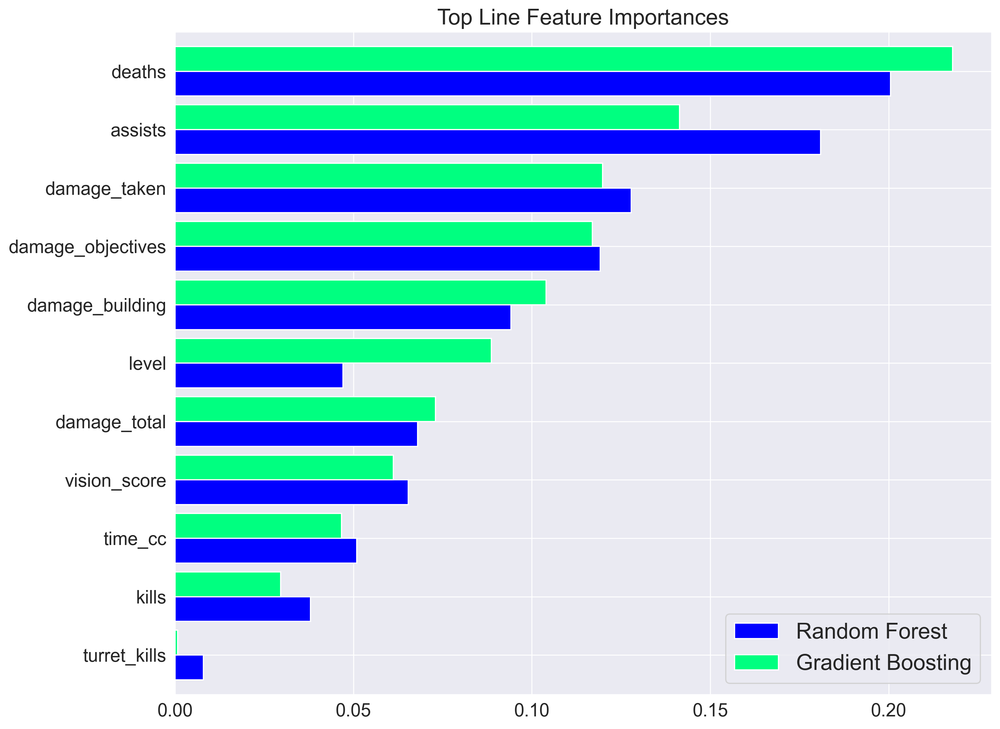

In [ ]:
top_feature_importance = pd.DataFrame({
    'Random Forest' : top_rf_grid_model.feature_importances_,
    'Gradient Boosting' : top_gb_grid_model.feature_importances_
}, index = Top_data.drop(columns = ['result']).columns)

top_feature_importance.sort_values(by = 'Gradient Boosting', ascending = True, inplace = True)

top_feature_importance.plot(kind = 'barh', figsize = (12,10), width = .85, colormap = 'winter', fontsize = 15)
plt.legend(fontsize = 18)
plt.title("Top Line Feature Importances", fontsize = 18);

JUNGLE LINE Feature Importances with Random Forest & Gradient Boosting

In [ ]:
x = Jungle_data.drop(['result'], axis = 1)
y = Jungle_data['result']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

In [ ]:
jungle_rf_model = RandomForestClassifier(random_state = 0)
jungle_rf_model.fit(x_train, y_train)

jungle_rf_param_grid = {
    'n_estimators' : [50, 100, 150, 200],
    'max_depth' : [8, 12, 16, 20],
    'max_features' : [3, 5, 7, 9],
    'min_samples_leaf' : [1, 3, 5, 7, 9],
    'min_samples_split' : [1, 2, 3, 5, 10]
}

jungle_rf_grid = GridSearchCV(jungle_rf_model, param_grid = jungle_rf_param_grid, scoring = 'accuracy',
                       n_jobs = -1, verbose = 1)

jungle_rf_grid.fit(x_train, y_train)

Fitting 5 folds for each of 1600 candidates, totalling 8000 fits


GridSearchCV(estimator=RandomForestClassifier(random_state=0), n_jobs=-1,
             param_grid={'max_depth': [8, 12, 16, 20],
                         'max_features': [3, 5, 7, 9],
                         'min_samples_leaf': [1, 3, 5, 7, 9],
                         'min_samples_split': [1, 2, 3, 5, 10],
                         'n_estimators': [50, 100, 150, 200]},
             scoring='accuracy', verbose=1)

In [ ]:
# 파라미터 튜닝

print("Highest Average Accuracy : {:.3f}".format(jungle_rf_grid.best_score_))
print("Best Parameter :", jungle_rf_grid.best_params_)

Highest Average Accuracy : 0.873
Best Parameter : {'max_depth': 8, 'max_features': 7, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 100}


In [ ]:
jungle_rf_grid_model = RandomForestClassifier(max_depth = 8, max_features = 7, min_samples_leaf = 1,
                                       min_samples_split = 3, n_estimators = 100)
jungle_rf_grid_model.fit(x_train, y_train)

RandomForestClassifier(max_depth=8, max_features=7, min_samples_split=3)

In [ ]:
predict = jungle_rf_grid_model.predict(x_test)

print("ACCURACY SCORE : {:.3f}".format(accuracy_score(y_test, predict)))
print("F1 SCORE : {:.3f}".format(f1_score(y_test, predict)))
print("ROC-AUC SCORE : {:.3f}".format(roc_auc_score(y_test, predict)))

ACCURACY SCORE : 0.896
F1 SCORE : 0.906
ROC-AUC SCORE : 0.894


In [ ]:
jungle_gb_model = GradientBoostingClassifier(random_state = 0)
jungle_gb_model.fit(x_train, y_train)

GradientBoostingClassifier(random_state=0)

In [ ]:
jungle_gb_param_grid = {
    'n_estimators' : [50, 100, 150, 200],
    'max_depth' : [4, 8, 11, 12, 16, 20],
    'max_features' : [3, 5, 7, 9],
    'min_samples_leaf' : [1, 3, 5, 7, 9],
    'min_samples_split' : [1, 2, 3, 5, 10],
    'learning_rate' : [0.05, 0.1, 0.2, 0.4, 0.6]
}

jungle_gb_grid = GridSearchCV(jungle_gb_model, param_grid = jungle_gb_param_grid, scoring = 'accuracy',
                       n_jobs = -1, verbose = 1)

jungle_gb_grid.fit(x_train, y_train)

Fitting 5 folds for each of 12000 candidates, totalling 60000 fits


GridSearchCV(estimator=GradientBoostingClassifier(random_state=0), n_jobs=-1,
             param_grid={'learning_rate': [0.05, 0.1, 0.2, 0.4, 0.6],
                         'max_depth': [4, 8, 11, 12, 16, 20],
                         'max_features': [3, 5, 7, 9],
                         'min_samples_leaf': [1, 3, 5, 7, 9],
                         'min_samples_split': [1, 2, 3, 5, 10],
                         'n_estimators': [50, 100, 150, 200]},
             scoring='accuracy', verbose=1)

In [ ]:
print("Highest Average Accuracy : {:.3f}".format(jungle_gb_grid.best_score_))
print("Best Parameter : ", jungle_gb_grid.best_params_)

Highest Average Accuracy : 0.879
Best Parameter :  {'learning_rate': 0.4, 'max_depth': 8, 'max_features': 9, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}


In [ ]:
jungle_gb_grid_model = GradientBoostingClassifier(learning_rate = 0.4, max_depth = 8, max_features = 9,
                                               min_samples_leaf = 1, min_samples_split = 2, n_estimators = 50)
jungle_gb_grid_model.fit(x_train, y_train)

GradientBoostingClassifier(learning_rate=0.4, max_depth=8, max_features=9,
                           n_estimators=50)

In [ ]:
predict = jungle_gb_grid_model.predict(x_test)

print("ACCURACY SCORE : {:.3f}".format(accuracy_score(y_test, predict)))
print("F1 SCORE : {:.3f}".format(f1_score(y_test, predict)))
print("ROC-AUC SCORE : {:.3f}".format(roc_auc_score(y_test, predict)))

ACCURACY SCORE : 0.860
F1 SCORE : 0.871
ROC-AUC SCORE : 0.859


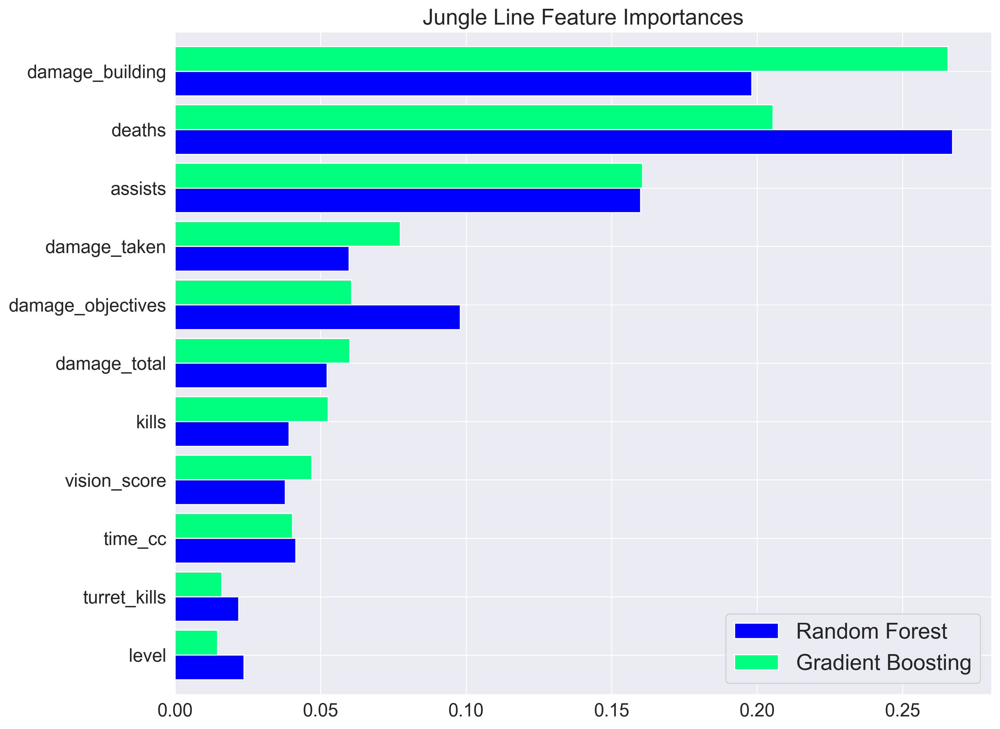

In [ ]:
jungle_feature_importance = pd.DataFrame({
    'Random Forest' : jungle_rf_grid_model.feature_importances_,
    'Gradient Boosting' : jungle_gb_grid_model.feature_importances_
}, index = Jungle_data.drop(columns = ['result']).columns)

jungle_feature_importance.sort_values(by = 'Gradient Boosting', ascending = True, inplace = True)

jungle_feature_importance.plot(kind = 'barh', figsize = (12,10), width = .85, colormap = 'winter', fontsize = 15)
plt.legend(fontsize = 18)
plt.title("Jungle Line Feature Importances", fontsize = 18);

MID LINE Feature Importances with Random Forest & Gradient Boosting

In [ ]:
x = Mid_data.drop(['result'], axis = 1)
y = Mid_data['result']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

In [ ]:
mid_rf_model = RandomForestClassifier(random_state = 0)
mid_rf_model.fit(x_train, y_train)

mid_rf_param_grid = {
    'n_estimators' : [50, 100, 150, 200],
    'max_depth' : [8, 12, 16, 20],
    'max_features' : [3, 5, 7, 9],
    'min_samples_leaf' : [1, 3, 5, 7, 9],
    'min_samples_split' : [1, 2, 3, 5, 10]
}

mid_rf_grid = GridSearchCV(mid_rf_model, param_grid = mid_rf_param_grid, scoring = 'accuracy',
                       n_jobs = -1, verbose = 1)

mid_rf_grid.fit(x_train, y_train)

Fitting 5 folds for each of 1600 candidates, totalling 8000 fits


GridSearchCV(estimator=RandomForestClassifier(random_state=0), n_jobs=-1,
             param_grid={'max_depth': [8, 12, 16, 20],
                         'max_features': [3, 5, 7, 9],
                         'min_samples_leaf': [1, 3, 5, 7, 9],
                         'min_samples_split': [1, 2, 3, 5, 10],
                         'n_estimators': [50, 100, 150, 200]},
             scoring='accuracy', verbose=1)

In [ ]:
# 파라미터 튜닝

print("Highest Average Accuracy : {:.3f}".format(mid_rf_grid.best_score_))
print("Best Parameter :", mid_rf_grid.best_params_)

Highest Average Accuracy : 0.833
Best Parameter : {'max_depth': 16, 'max_features': 7, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


In [ ]:
mid_rf_grid_model = RandomForestClassifier(max_depth = 16, max_features = 7, min_samples_leaf = 1,
                                       min_samples_split = 2, n_estimators = 100)
mid_rf_grid_model.fit(x_train, y_train)

RandomForestClassifier(max_depth=16, max_features=7)

In [ ]:
predict = mid_rf_grid_model.predict(x_test)

print("ACCURACY SCORE : {:.3f}".format(accuracy_score(y_test, predict)))
print("F1 SCORE : {:.3f}".format(f1_score(y_test, predict)))
print("ROC-AUC SCORE : {:.3f}".format(roc_auc_score(y_test, predict)))

ACCURACY SCORE : 0.839
F1 SCORE : 0.820
ROC-AUC SCORE : 0.838


In [ ]:
mid_gb_model = GradientBoostingClassifier(random_state = 0)
mid_gb_model.fit(x_train, y_train)

GradientBoostingClassifier(random_state=0)

In [ ]:
mid_gb_param_grid = {
    'n_estimators' : [50, 100, 150, 200],
    'max_depth' : [4, 8, 11, 12, 16, 20],
    'max_features' : [3, 5, 7, 9],
    'min_samples_leaf' : [1, 3, 5, 7, 9],
    'min_samples_split' : [1, 2, 3, 5, 10],
    'learning_rate' : [0.05, 0.1, 0.2, 0.4, 0.6]
}

mid_gb_grid = GridSearchCV(mid_gb_model, param_grid = mid_gb_param_grid, scoring = 'accuracy',
                       n_jobs = -1, verbose = 1)

mid_gb_grid.fit(x_train, y_train)

Fitting 5 folds for each of 12000 candidates, totalling 60000 fits


GridSearchCV(estimator=GradientBoostingClassifier(random_state=0), n_jobs=-1,
             param_grid={'learning_rate': [0.05, 0.1, 0.2, 0.4, 0.6],
                         'max_depth': [4, 8, 11, 12, 16, 20],
                         'max_features': [3, 5, 7, 9],
                         'min_samples_leaf': [1, 3, 5, 7, 9],
                         'min_samples_split': [1, 2, 3, 5, 10],
                         'n_estimators': [50, 100, 150, 200]},
             scoring='accuracy', verbose=1)

In [ ]:
print("Highest Average Accuracy : {:.3f}".format(mid_gb_grid.best_score_))
print("Best Parameter : ", mid_gb_grid.best_params_)

Highest Average Accuracy : 0.839
Best Parameter :  {'learning_rate': 0.1, 'max_depth': 4, 'max_features': 5, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}


In [ ]:
mid_gb_grid_model = GradientBoostingClassifier(learning_rate = 0.1, max_depth = 4, max_features = 5,
                                               min_samples_leaf = 1, min_samples_split = 2, n_estimators = 50)
mid_gb_grid_model.fit(x_train, y_train)

GradientBoostingClassifier(max_depth=4, max_features=5, n_estimators=50)

In [ ]:
predict = mid_gb_grid_model.predict(x_test)

print("ACCURACY SCORE : {:.3f}".format(accuracy_score(y_test, predict)))
print("F1 SCORE : {:.3f}".format(f1_score(y_test, predict)))
print("ROC-AUC SCORE : {:.3f}".format(roc_auc_score(y_test, predict)))

ACCURACY SCORE : 0.830
F1 SCORE : 0.810
ROC-AUC SCORE : 0.828


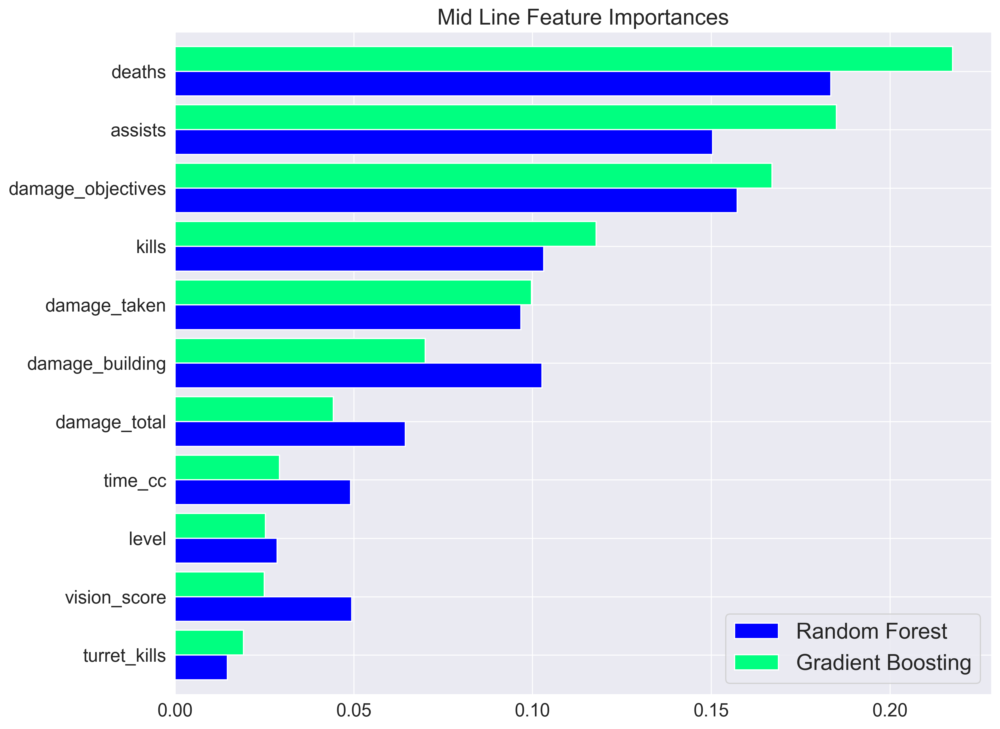

In [ ]:
mid_feature_importance = pd.DataFrame({
    'Random Forest' : mid_rf_grid_model.feature_importances_,
    'Gradient Boosting' : mid_gb_grid_model.feature_importances_
}, index = Mid_data.drop(columns = ['result']).columns)

mid_feature_importance.sort_values(by = 'Gradient Boosting', ascending = True, inplace = True)

mid_feature_importance.plot(kind = 'barh', figsize = (12,10), width = .85, colormap = 'winter', fontsize = 15)
plt.legend(fontsize = 18)
plt.title("Mid Line Feature Importances", fontsize = 18);

BOT LINE Feature Importances with Random Forest & Gradient Boosting

In [ ]:
x = Bot_data.drop(['result'], axis = 1)
y = Bot_data['result']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

In [ ]:
bot_rf_model = RandomForestClassifier(random_state = 0)
bot_rf_model.fit(x_train, y_train)

bot_rf_param_grid = {
    'n_estimators' : [50, 100, 150, 200],
    'max_depth' : [8, 12, 16, 20],
    'max_features' : [3, 5, 7, 9],
    'min_samples_leaf' : [1, 3, 5, 7, 9],
    'min_samples_split' : [1, 2, 3, 5, 10]
}

bot_rf_grid = GridSearchCV(bot_rf_model, param_grid = bot_rf_param_grid, scoring = 'accuracy',
                       n_jobs = -1, verbose = 1)

bot_rf_grid.fit(x_train, y_train)

Fitting 5 folds for each of 1600 candidates, totalling 8000 fits


GridSearchCV(estimator=RandomForestClassifier(random_state=0), n_jobs=-1,
             param_grid={'max_depth': [8, 12, 16, 20],
                         'max_features': [3, 5, 7, 9],
                         'min_samples_leaf': [1, 3, 5, 7, 9],
                         'min_samples_split': [1, 2, 3, 5, 10],
                         'n_estimators': [50, 100, 150, 200]},
             scoring='accuracy', verbose=1)

In [ ]:
# 파라미터 튜닝

print("Highest Average Accuracy : {:.3f}".format(bot_rf_grid.best_score_))
print("Best Parameter :", bot_rf_grid.best_params_)

Highest Average Accuracy : 0.878
Best Parameter : {'max_depth': 20, 'max_features': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


In [ ]:
bot_rf_grid_model = RandomForestClassifier(max_depth = 20, max_features = 3, min_samples_leaf = 1,
                                       min_samples_split = 2, n_estimators = 100)
bot_rf_grid_model.fit(x_train, y_train)

RandomForestClassifier(max_depth=20, max_features=3)

In [ ]:
predict = bot_rf_grid_model.predict(x_test)

print("ACCURACY SCORE : {:.3f}".format(accuracy_score(y_test, predict)))
print("F1 SCORE : {:.3f}".format(f1_score(y_test, predict)))
print("ROC-AUC SCORE : {:.3f}".format(roc_auc_score(y_test, predict)))

ACCURACY SCORE : 0.853
F1 SCORE : 0.852
ROC-AUC SCORE : 0.853


In [ ]:
bot_gb_model = GradientBoostingClassifier(random_state = 0)
bot_gb_model.fit(x_train, y_train)

GradientBoostingClassifier(random_state=0)

In [ ]:
bot_gb_param_grid = {
    'n_estimators' : [50, 100, 150, 200],
    'max_depth' : [4, 8, 11, 12, 16, 20],
    'max_features' : [3, 5, 7, 9],
    'min_samples_leaf' : [1, 3, 5, 7, 9],
    'min_samples_split' : [1, 2, 3, 5, 10],
    'learning_rate' : [0.05, 0.1, 0.2, 0.4, 0.6]
}

bot_gb_grid = GridSearchCV(bot_gb_model, param_grid = bot_gb_param_grid, scoring = 'accuracy',
                       n_jobs = -1, verbose = 1)

bot_gb_grid.fit(x_train, y_train)

Fitting 5 folds for each of 12000 candidates, totalling 60000 fits


GridSearchCV(estimator=GradientBoostingClassifier(random_state=0), n_jobs=-1,
             param_grid={'learning_rate': [0.05, 0.1, 0.2, 0.4, 0.6],
                         'max_depth': [4, 8, 11, 12, 16, 20],
                         'max_features': [3, 5, 7, 9],
                         'min_samples_leaf': [1, 3, 5, 7, 9],
                         'min_samples_split': [1, 2, 3, 5, 10],
                         'n_estimators': [50, 100, 150, 200]},
             scoring='accuracy', verbose=1)

In [ ]:
print("Highest Average Accuracy : {:.3f}".format(bot_gb_grid.best_score_))
print("Best Parameter : ", bot_gb_grid.best_params_)

Highest Average Accuracy : 0.887
Best Parameter :  {'learning_rate': 0.6, 'max_depth': 20, 'max_features': 3, 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 50}


In [ ]:
bot_gb_grid_model = GradientBoostingClassifier(learning_rate = 0.6, max_depth = 20, max_features = 3,
                                               min_samples_leaf = 5, min_samples_split = 2, n_estimators = 50)
bot_gb_grid_model.fit(x_train, y_train)

GradientBoostingClassifier(learning_rate=0.6, max_depth=20, max_features=3,
                           min_samples_leaf=5, n_estimators=50)

In [ ]:
predict = bot_gb_grid_model.predict(x_test)

print("ACCURACY SCORE : {:.3f}".format(accuracy_score(y_test, predict)))
print("F1 SCORE : {:.3f}".format(f1_score(y_test, predict)))
print("ROC-AUC SCORE : {:.3f}".format(roc_auc_score(y_test, predict)))

ACCURACY SCORE : 0.858
F1 SCORE : 0.853
ROC-AUC SCORE : 0.858


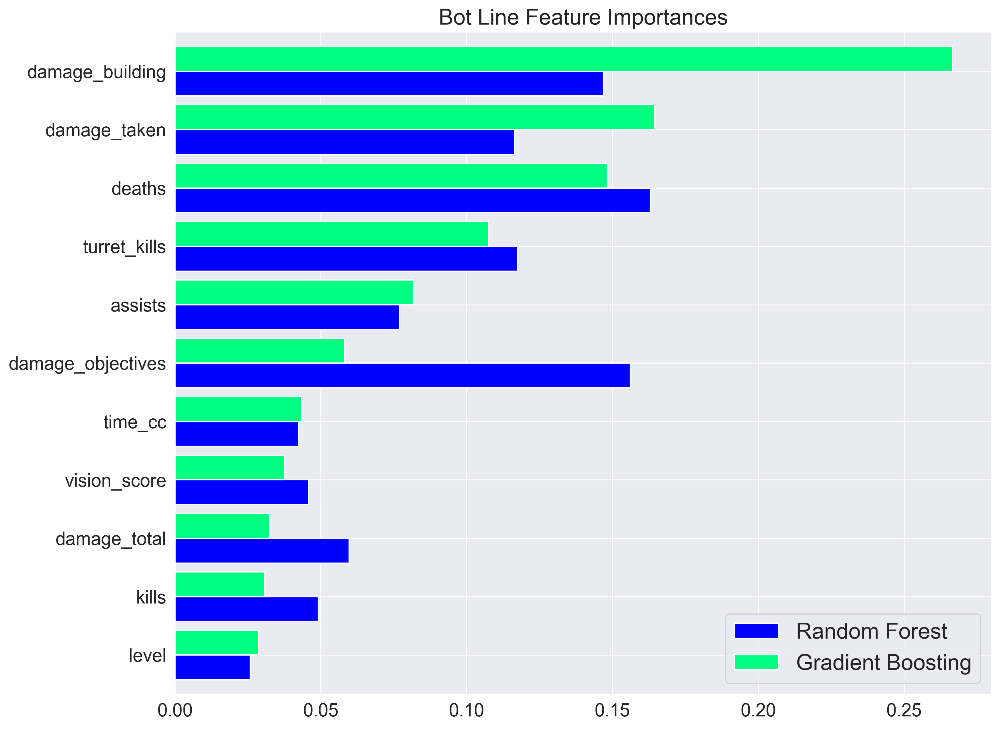

In [ ]:
bot_feature_importance = pd.DataFrame({
    'Random Forest' : bot_rf_grid_model.feature_importances_,
    'Gradient Boosting' : bot_gb_grid_model.feature_importances_
}, index = Jungle_data.drop(columns = ['result']).columns)

bot_feature_importance.sort_values(by = 'Gradient Boosting', ascending = True, inplace = True)

bot_feature_importance.plot(kind = 'barh', figsize = (12,10), width = .85, colormap = 'winter', fontsize = 15)
plt.legend(fontsize = 18)
plt.title("Bot Line Feature Importances", fontsize = 18);

SUPPORT LINE Feature Importances with Random Forest & Gradient Boosting

In [ ]:
x = Support_data.drop(['result'], axis = 1)
y = Support_data['result']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

In [ ]:
support_rf_model = RandomForestClassifier(random_state = 0)
support_rf_model.fit(x_train, y_train)

support_rf_param_grid = {
    'n_estimators' : [50, 100, 150, 200],
    'max_depth' : [8, 12, 16, 20],
    'max_features' : [3, 5, 7, 9],
    'min_samples_leaf' : [1, 3, 5, 7, 9],
    'min_samples_split' : [1, 2, 3, 5, 10]
}

support_rf_grid = GridSearchCV(support_rf_model, param_grid = support_rf_param_grid, scoring = 'accuracy',
                       n_jobs = -1, verbose = 1)

support_rf_grid.fit(x_train, y_train)

Fitting 5 folds for each of 1600 candidates, totalling 8000 fits


GridSearchCV(estimator=RandomForestClassifier(random_state=0), n_jobs=-1,
             param_grid={'max_depth': [8, 12, 16, 20],
                         'max_features': [3, 5, 7, 9],
                         'min_samples_leaf': [1, 3, 5, 7, 9],
                         'min_samples_split': [1, 2, 3, 5, 10],
                         'n_estimators': [50, 100, 150, 200]},
             scoring='accuracy', verbose=1)

In [ ]:
# 파라미터 튜닝

print("Highest Average Accuracy : {:.3f}".format(support_rf_grid.best_score_))
print("Best Parameter :", support_rf_grid.best_params_)

Highest Average Accuracy : 0.830
Best Parameter : {'max_depth': 16, 'max_features': 3, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 150}


In [ ]:
support_rf_grid_model = RandomForestClassifier(max_depth = 16, max_features = 3, min_samples_leaf = 1,
                                       min_samples_split = 10, n_estimators = 150)
support_rf_grid_model.fit(x_train, y_train)

RandomForestClassifier(max_depth=16, max_features=3, min_samples_split=10,
                       n_estimators=150)

In [ ]:
predict = support_rf_grid_model.predict(x_test)

print("ACCURACY SCORE : {:.3f}".format(accuracy_score(y_test, predict)))
print("F1 SCORE : {:.3f}".format(f1_score(y_test, predict)))
print("ROC-AUC SCORE : {:.3f}".format(roc_auc_score(y_test, predict)))

ACCURACY SCORE : 0.798
F1 SCORE : 0.814
ROC-AUC SCORE : 0.797


In [ ]:
support_gb_model = GradientBoostingClassifier(random_state = 0)
support_gb_model.fit(x_train, y_train)

GradientBoostingClassifier(random_state=0)

In [ ]:
support_gb_param_grid = {
    'n_estimators' : [50, 100, 150, 200],
    'max_depth' : [4, 8, 11, 12, 16, 20],
    'max_features' : [3, 5, 7, 9],
    'min_samples_leaf' : [1, 3, 5, 7, 9],
    'min_samples_split' : [1, 2, 3, 5, 10],
    'learning_rate' : [0.05, 0.1, 0.2, 0.4, 0.6]
}

support_gb_grid = GridSearchCV(support_gb_model, param_grid = support_gb_param_grid, scoring = 'accuracy',
                       n_jobs = -1, verbose = 1)

support_gb_grid.fit(x_train, y_train)

Fitting 5 folds for each of 12000 candidates, totalling 60000 fits


GridSearchCV(estimator=GradientBoostingClassifier(random_state=0), n_jobs=-1,
             param_grid={'learning_rate': [0.05, 0.1, 0.2, 0.4, 0.6],
                         'max_depth': [4, 8, 11, 12, 16, 20],
                         'max_features': [3, 5, 7, 9],
                         'min_samples_leaf': [1, 3, 5, 7, 9],
                         'min_samples_split': [1, 2, 3, 5, 10],
                         'n_estimators': [50, 100, 150, 200]},
             scoring='accuracy', verbose=1)

In [ ]:
print("Highest Average Accuracy : {:.3f}".format(support_gb_grid.best_score_))
print("Best Parameter : ", support_gb_grid.best_params_)

Highest Average Accuracy : 0.839
Best Parameter :  {'learning_rate': 0.6, 'max_depth': 4, 'max_features': 9, 'min_samples_leaf': 3, 'min_samples_split': 10, 'n_estimators': 200}


In [ ]:
support_gb_grid_model = GradientBoostingClassifier(learning_rate = 0.6, max_depth = 4, max_features = 9,
                                               min_samples_leaf = 3, min_samples_split = 10, n_estimators = 200)
support_gb_grid_model.fit(x_train, y_train)

GradientBoostingClassifier(learning_rate=0.6, max_depth=4, max_features=9,
                           min_samples_leaf=3, min_samples_split=10,
                           n_estimators=200)

In [ ]:
predict = support_gb_grid_model.predict(x_test)

print("ACCURACY SCORE : {:.3f}".format(accuracy_score(y_test, predict)))
print("F1 SCORE : {:.3f}".format(f1_score(y_test, predict)))
print("ROC-AUC SCORE : {:.3f}".format(roc_auc_score(y_test, predict)))

ACCURACY SCORE : 0.803
F1 SCORE : 0.820
ROC-AUC SCORE : 0.802


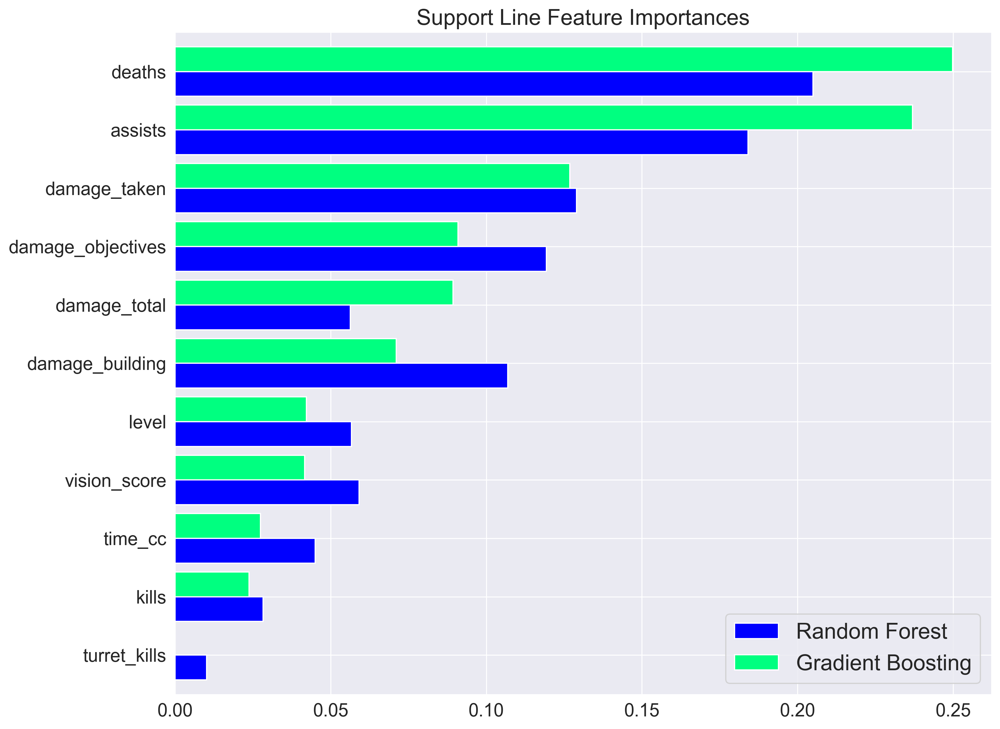

In [ ]:
support_feature_importance = pd.DataFrame({
    'Random Forest' : support_rf_grid_model.feature_importances_,
    'Gradient Boosting' : support_gb_grid_model.feature_importances_
}, index = Support_data.drop(columns = ['result']).columns)

support_feature_importance.sort_values(by = 'Gradient Boosting', ascending = True, inplace = True)

support_feature_importance.plot(kind = 'barh', figsize = (12,10), width = .85, colormap = 'winter', fontsize = 15)
plt.legend(fontsize = 18)
plt.title("Support Line Feature Importances", fontsize = 18);